# Import packages, open data

In [1]:
from sklearn.cluster import KMeans

In [2]:
import h5py
import seaborn as sns
from datetime import datetime
#from skimage.io import imsave
import openpyxl
import numpy as np
import matplotlib.pyplot as plt
#%plt.style.use("v_paper")
import pandas as pd
from scipy.io import loadmat
from scipy.io import savemat
%matplotlib inline
import seaborn as sns
import statsmodels.formula.api as smf
import re
from statsmodels.stats.anova import anova_lm
import os
import os.path
#import statsmodels.api as smapi
import sys
import warnings
from sklearn.linear_model import LinearRegression
if not sys.warnoptions:
    warnings.simplefilter("ignore")
import seaborn as sns
import statsmodels as sm
import scipy
from pathlib import Path
from itertools import chain
from scipy import optimize

In [3]:
plt.rcParams['axes.facecolor'] = 'white'

In [4]:
def piecewise_linear(x, x0, y0, k1, k2):
    return np.piecewise(x, [x < x0], [lambda x:k1*x + y0-k1*x0, lambda x:k2*x + y0-k2*x0])

In [9]:
NameList=['ALdm','ALd','ALvm','ALal','Gamma1','Gamma2','Gamma3','Gamma4','Gamma5','Beta1','beta2','Alpha2','Alpha3','CAl','CAm','PI','SMPm','SMPplproj','SMPlvp','SMPlda','SIPd','SLPpv','SLPpd','SLPa','LHdm','LHvm','LHvl','LHl','LHdl','Sup.Cl.','InferiorClamp','IB-Antl','FBd','FBl','FBv','EBp','EBa','PBp','PBm','PBl','PBml','LAL','PRW','Saddle','AMMCa','AMMCp','GNGm','GNGav','GNGv','GNGdam','GNGdl','GNGlda','GNGvl','GNGm','Vest','SPSm','SPSl','SPSdl','IPS','AVLPm','AVLPav','AVLPabulk','AVLPaav','AVLPl','AVLPd','AVLPpv','AVLPpbulk','AVLPdm','Wedgea','Wedgep','PLPd','PLPdp','PLPpl','LO','OL','ALdm','ALd','ALvm','ALal','Gamma1','Gamma2','Gamma3','Gamma4','Gamma5','Beta1','beta2','Alpha2','Alpha3','CAl','CAm','PI','SMPm','SMPplproj','SMPlvp','SMPlda','SIPd','SLPpv','SLPpd','SLPa','LHdm','LHvm','LHvl','LHl','LHdl','Sup.Cl.','InferiorClamp','IB-Antl','FBd','FBl','FBv','EBp','EBa','PBp','PBm','PBl','PBml','LAL','PRW','Saddle','AMMCa','AMMCp','GNGm','GNGav','GNGv','GNGdam','GNGdl','GNGlda','GNGvl','GNGm','Vest','SPSm','SPSl','SPSdl','IPS','AVLPm','AVLPav','AVLPabulk','AVLPaav','AVLPl','AVLPd','AVLPpv','AVLPpbulk','AVLPdm','Wedgea','Wedgep','PLPd','PLPdp','PLPpl','LO','OL'];

(5523, 1)
100761


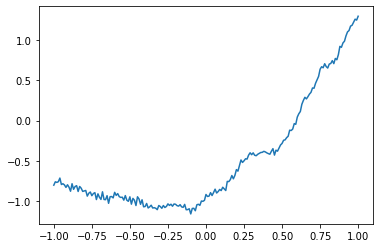

(1, 5115)
100762


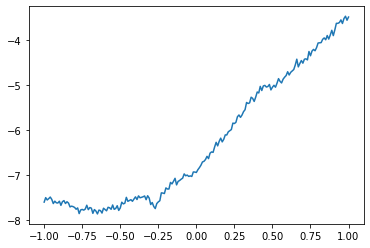

(10607, 1)
100106
(4995, 1)
B34


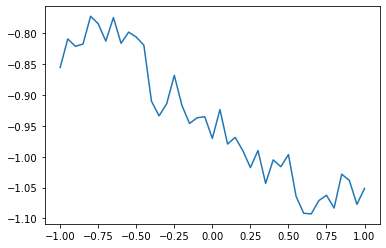

(4997, 1)
B35


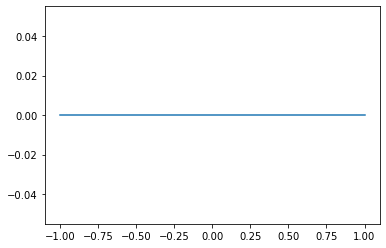

(4997, 1)
B36


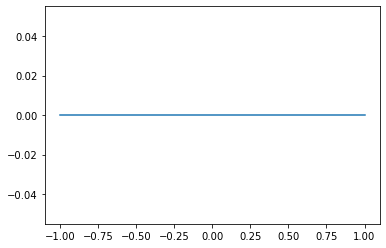

(4995, 1)
B37


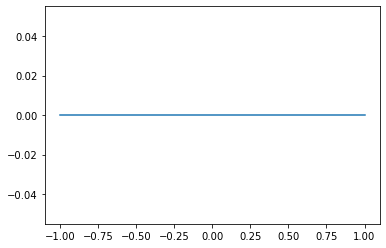

(4995, 1)
B38


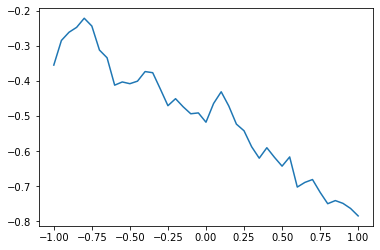

(5000, 1)
B39


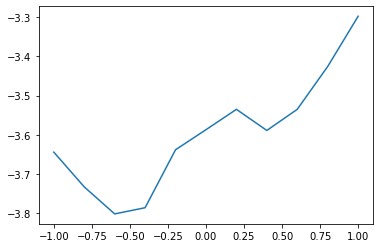

(5000, 1)
B40


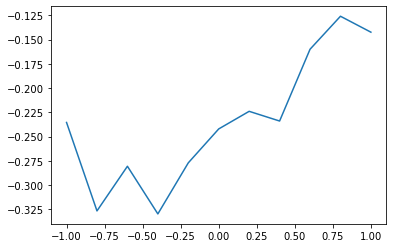

(4995, 1)
B41


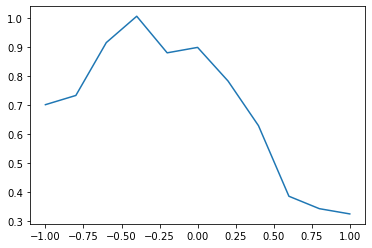

(7997, 1)
B43


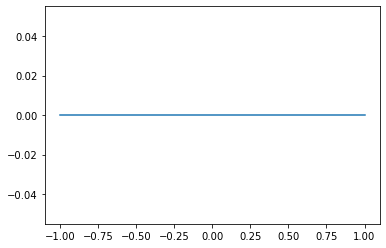

(1, 5094)
B180


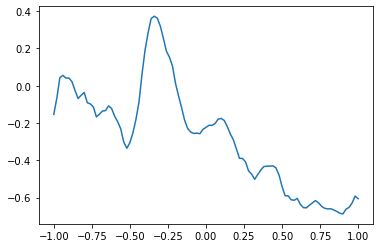

(4995, 1)
B182


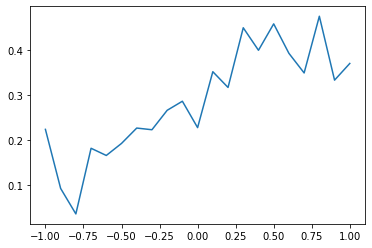

(4996, 1)
B183


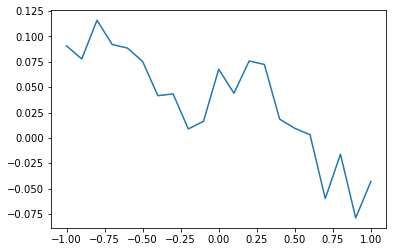

(2000, 1)
B192


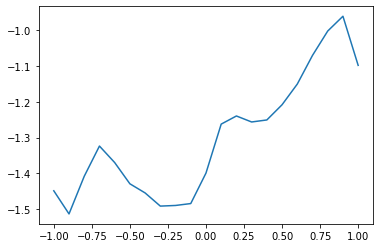

(4999, 1)
B193


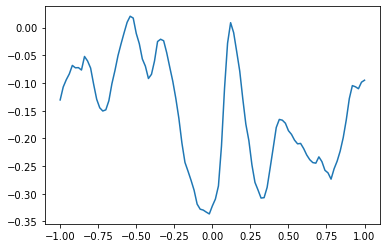

(4998, 1)
B194


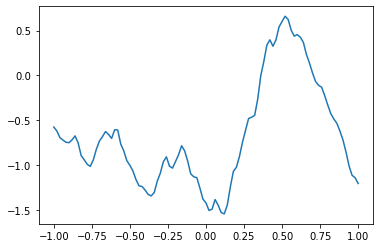

(4997, 1)
B195


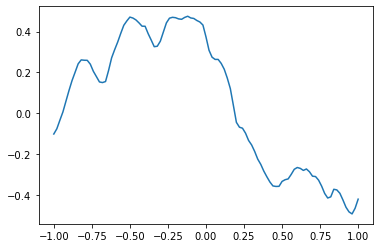

(4996, 1)
B196


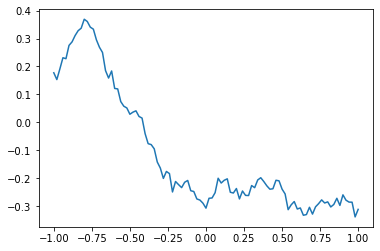

(4579, 1)
100609


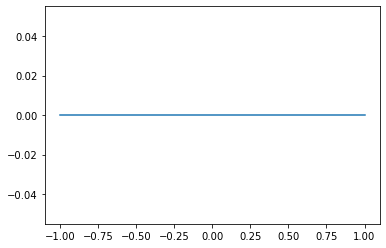

(23265, 1)
981
(20650, 1)
100133
(1, 5998)
B996
(1, 950)
B1037


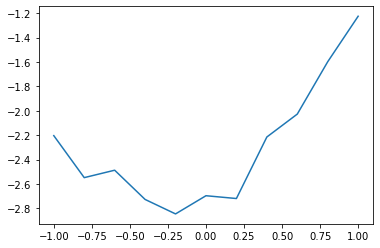

(1, 1500)
B1047


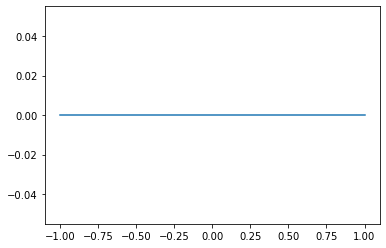

In [32]:
GoodICFiles=GoodICFiles.query('GAL4 == "Nsyb" or GAL4 == "GMR57C10"')
Regionsdf=Regionsdf.query('GAL4 == "Nsyb" or GAL4 == "GMR57C10"')

Corronoff200=np.zeros((GoodICFiles.shape[0],75,201))
Corroff200=np.zeros((GoodICFiles.shape[0],75,201))
Corron200=np.zeros((GoodICFiles.shape[0],75,201))
Corron200Time=np.zeros((GoodICFiles.shape[0],75))
Regionsdf['OnTime']=np.nan
Corron200Trials=np.zeros((10000,75,201))
Trials=np.zeros((GoodICFiles.shape[0],75))

xnew = np.linspace(-1, 1, num=201, endpoint=True)
k=np.zeros(75)

#for i in chain(range(134), range(135, 244), range(245, GoodICFiles.shape[0])):
for i in range(2,GoodICFiles.shape[0]):
    try:
        if GoodICFiles.iloc[i]['ForcedWalkRegressor'] != '':
            TS=loadmat("C:\\Users\\Soso\\Desktop\\FuncRegionTS\\"+list(GoodICFiles.loc[GoodICFiles.index == i]['expID'])[0]+"_150FuncRegionsTS.mat")['TS']

            try:
                Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('kd',''))['R']
            except:
                try:
                    Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('kd',''))['RForcedWalk']
                except:
                    try:
                        Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('ForcedWalkRbinkd','Rbin'))['R']
                    except:
                        try:
                            Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('Rbinkd','Rbin'))['Rbin']
                        except:
                            Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('kd',''))['Rbin']
            print(Regressor.shape)
            if Regressor.shape[0]<Regressor.shape[1]:
                Regressor=Regressor.T
            if TS.shape[0]>TS.shape[1]:
                TS=TS.T            
   
            # processed time series have 2 less time points from kalman filter processing, and sometimes one time point difference from triggering imprecisions.

            if TS.shape[1]==(Regressor.shape[0]-2):
                Regressor=Regressor[1:Regressor.shape[0]-1]   
            if TS.shape[1]==(Regressor.shape[0]-3):
                Regressor=Regressor[2:Regressor.shape[0]-1]                
            if TS.shape[1]==(Regressor.shape[0]-1):
                Regressor=Regressor[1:Regressor.shape[0]]               
            if TS.shape[1]==(Regressor.shape[0]+1):
                TS=TS[:,0:Regressor.shape[0]] 


            TS=TS[range(75),:]+TS[range(75,150),:]
            #if len(TS)!=1 and pd.isnull(FR)==False:
            if len(TS)!=1:
                FR=GoodICFiles.iloc[i]['FR']
                print(GoodICFiles.iloc[i]['expID'])
                           
                Ron=np.zeros(len(Regressor))
                Roff=np.zeros(len(Regressor))
                for m in range(int(2*FR),int(len(Regressor)-2*FR)):
                    if Regressor[m]==1 and all(Regressor[int(m-2*FR):int(m)]==0) and (np.mean(Regressor[int(m+1):int(m+0.5*FR)])>0.5):
                        Ron[m]=1                        
                    if Regressor[m]==1 and all(Regressor[int(m+1):int(m+1*FR)]==0) and (np.mean(Regressor[int(m-1*FR):int(m-1)])>0.5):
                        Roff[m+1]=1                    
                

                for j in range(75):    

                    if np.isnan(np.mean(TS[j,:]))==False:
                        TS[j,:]=TS[j,:]/np.nanmax(TS[j,:])
                        Ton=[p for p in range(len(np.squeeze(Ron.T))) if Ron[p]==1]
                        
                        ## full correlation
                        Corr=np.correlate(TS[j,:],np.squeeze(Regressor.T), 'full')
                        Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
                        x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
                        Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')                        
                        Corronoff200[i,j,:]=Corronoff200[i,j,:]+Corrlocint(xnew)

                        ## onset correlation
                        Corr=np.correlate(TS[j,:],np.squeeze(Ron.T), 'full')
                        #lags = scipy.signal.correlation_lags(len(TS[j,:])/FR)
                        Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
                        Corrloc50=Corr[int(((len(Corr)-1)/2)-FR):int(((len(Corr)-1)/2)+0.5*FR)+1]
                        x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
                        x50 = np.linspace(-1, 0.5, num=len(Corrloc50), endpoint=True)
                        Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')
                        
                        Corron200[i,j,:]=Corron200[i,j,:]+Corrlocint(xnew)
                        
                        if j==32:
                            plt.plot(x,Corrloc)                            
                        ## get peri-onset time series per trial
                        for l in range(int(sum(Ron))):
                            Tloc=TS[j,int(Ton[l]-FR):int(Ton[l]+FR+1)]
                            #x = np.linspace(-1, 1, num=len(Tloc), endpoint=True)
                            Tlocint=scipy.interpolate.interp1d(x,Tloc, kind='cubic')
                            Corron200Trials[int(k[j]+l),j,:]=Tlocint(xnew)

                        plt.show()   
                        k[j]=k[j]+sum(Ron)
                        Trials[i,j]=sum(Ron) 
                        del Corrlocint, Corrloc, Corr
                        
                        Corr=np.correlate(TS[j,:],np.squeeze(Roff.T), 'full')
                        Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
                        x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
                        Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')
                        Corroff200[i,j,:]=Corroff200[i,j,:]+Corrlocint(xnew)

                del TS
                
    except:
         continue   


#Corron200Time[i,NameList.index(RegName)]=Corron200Time[i,NameList.index(RegName)]/(k[NameList.index(RegName)]+1)

np.save('PANFuncRegionsCorron200Time_allfreq.npy',Corron200Time)
np.save('PANFunRegionsCorron200_sllfreq.npy',Corron200)

In [33]:
int(max(sum(Trials)))

139

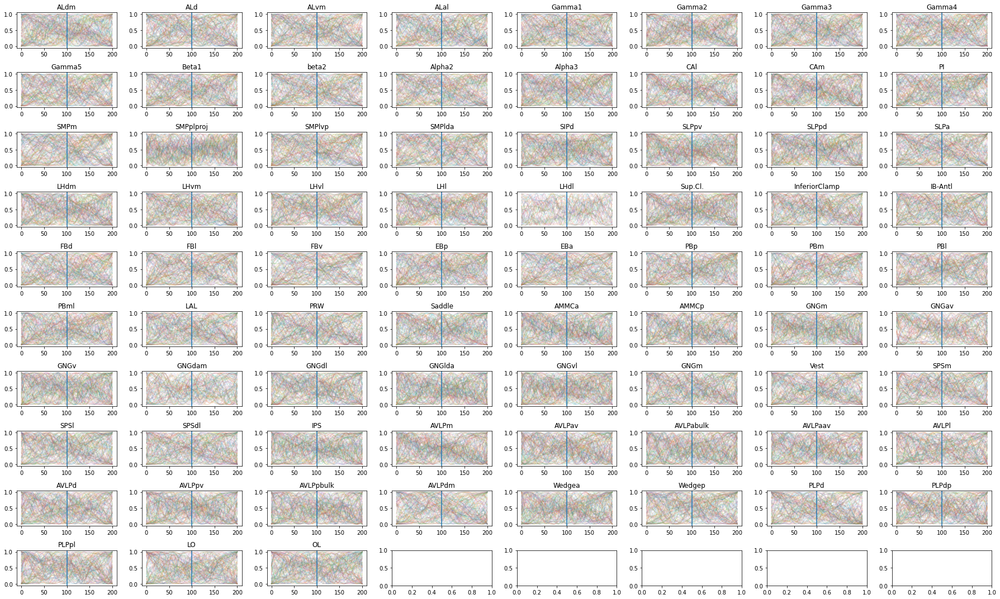

In [34]:
Corron200n=np.zeros((GoodICFiles.shape[0],75,201))
Corron200Trialn=np.zeros((int(max(sum(Trials))),75,201))
FRs=np.zeros((GoodICFiles.shape[0],75))

# Plot all trials
CorrOn=np.zeros((75,201))
fig, axs = plt.subplots(10, 8,figsize=(25,15))
for j in range(75):
    for k in range((int(max(sum(Trials))))):
        C=Corron200Trials[k,j,:]
        if (np.nanmax(C)-np.nanmin(C))!=0:
            Corron200Trialn[k,j,:]=(C-np.nanmin(C))/(np.nanmax(C)-np.nanmin(C))            
            axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(Corron200Trialn[k,j,:],alpha=0.1)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j]) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)

#    except:
  #       continue   
plt.tight_layout()
plt.show()

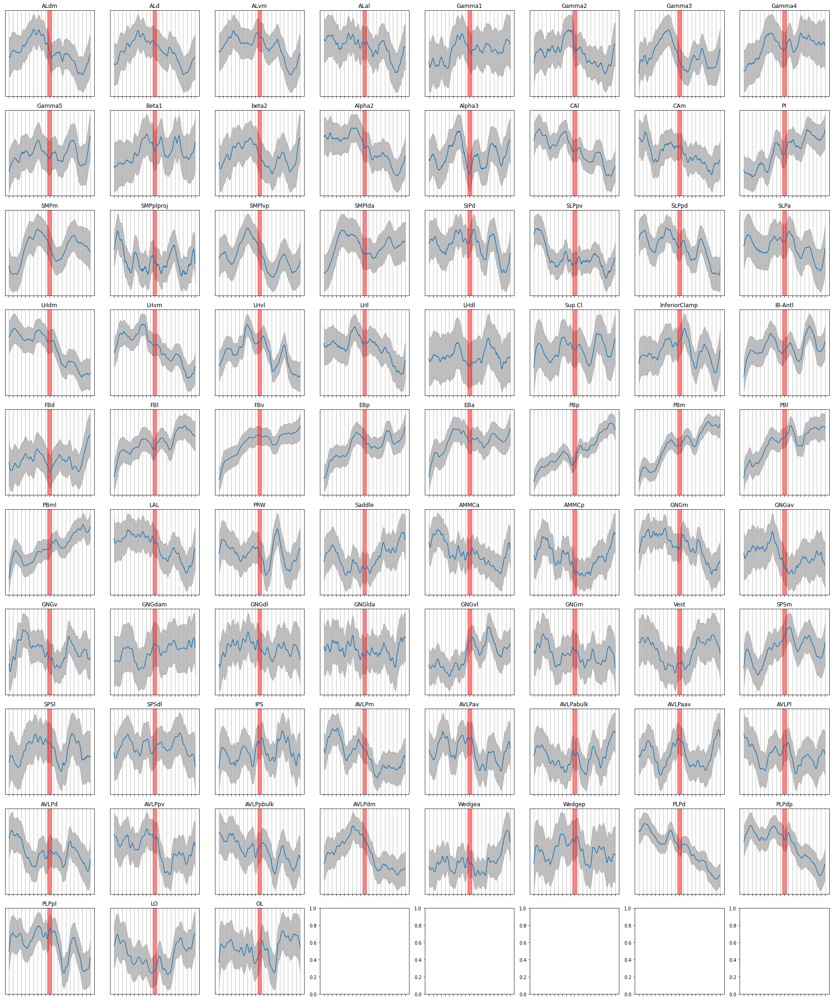

In [35]:
# Plot trial average
CorrOn=np.zeros((75,201))
d=8
fig, axs = plt.subplots(10,d,figsize=(25,30),sharex=True)
l=0
for j in range(75):
    if sum(Trials[:,j])>5:
        err=np.nanstd(Corron200Trialn[:,j,:],axis=0)/np.sqrt(sum(Trials[:,j])-1)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].plot(np.nanmean(Corron200Trialn[:,j,:],axis=0))
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(err+np.nanmean(CompCorron200n[:,j,:],axis=0))
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CompCorron200n[:,j,:],axis=0)-err)
        axs[int(np.floor(l/d)),j-int(np.floor(l/d)*d)].set_title(NameList[j])     
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between((np.nanmean(CompCorron200n[:,j,:],axis=0)-err), (np.nanmean(CompCorron200n[i,j,:],axis=0)+err),color='grey',alpha=0.5)  
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].fill_between(range(201),np.nanmean(Corron200Trialn[:,j,:],axis=0)-err,err+np.nanmean(Corron200Trialn[:,j,:],axis=0),color='grey',
                     alpha=0.5)  
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_xaxis().set_visible(False)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].get_yaxis().set_visible(False)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].axvspan(100-5, 100+5, alpha=0.5, color='red')
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].set_xticks([0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190,200])
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].set_xticklabels([])
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].xaxis.grid()
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xlim(50,151)
        for tic in axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].xaxis.get_major_ticks():
            tic.tick1On = tic.tick2On = False

        l=l+1

    #print(np.nanmax(CompCorrOnOff[j,:]))
plt.tight_layout()    
plt.savefig('Z:\GrunwaldKadow_group\Sophie\ForcedWalkProject\Figures\Figure6\Fig6FuncRegionsPANCorrononentsTrialsAv.svg')
plt.savefig('Z:\GrunwaldKadow_group\Sophie\ForcedWalkProject\Figures\Figure6\Fig6FuncRegionsPANCorrononentsTrialsAv.png')
plt.show() 


In [ ]:
Corroff200n=np.zeros((GoodICFiles.shape[0],75,201))
Corroff200Trialn=np.zeros((int(max(sum(Trials))),75,201))
FRs=np.zeros((GoodICFiles.shape[0],75))

# Plot all trials
CorrOff=np.zeros((75,201))
fig, axs = plt.subplots(10, 8,figsize=(25,15))
for j in range(75):
    for k in range((int(max(sum(Trials))))):
        C=Corroff200Trials[k,j,:]
        if (np.nanmax(C)-np.nanmin(C))!=0:
            Corroff200Trialn[k,j,:]=(C-np.nanmin(C))/(np.nanmax(C)-np.nanmin(C))            
            axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(Corroff200Trialn[k,j,:],alpha=0.1)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j]) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)

#    except:
  #       continue   
plt.tight_layout()
plt.show()

In [ ]:
# Plot trial average
CorrOff=np.zeros((75,201))
d=8
fig, axs = plt.subplots(10,d,figsize=(25,30),sharex=True)
l=0
for j in range(75):
    if sum(Trials[:,j])>5:
        err=np.nanstd(Corroff200Trialn[:,j,:],axis=0)/np.sqrt(sum(Trials[:,j])-1)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].plot(np.nanmean(Corroff200Trialn[:,j,:],axis=0))
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(err+np.nanmean(CompCorron200n[:,j,:],axis=0))
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CompCorron200n[:,j,:],axis=0)-err)
        axs[int(np.floor(l/d)),j-int(np.floor(l/d)*d)].set_title(NameList[j])     
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between((np.nanmean(CompCorron200n[:,j,:],axis=0)-err), (np.nanmean(CompCorron200n[i,j,:],axis=0)+err),color='grey',alpha=0.5)  
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].fill_between(range(201),np.nanmean(Corron200Trialn[:,j,:],axis=0)-err,err+np.nanmean(Corron200Trialn[:,j,:],axis=0),color='grey',
                     alpha=0.5)  
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_xaxis().set_visible(False)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].get_yaxis().set_visible(False)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].axvspan(100-5, 100+5, alpha=0.5, color='red')
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].set_xticks([0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190,200])
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].set_xticklabels([])
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].xaxis.grid()
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xlim(50,151)
        for tic in axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].xaxis.get_major_ticks():
            tic.tick1On = tic.tick2On = False

        l=l+1

    #print(np.nanmax(CompCorrOnOff[j,:]))
plt.tight_layout()    
plt.savefig('Z:\GrunwaldKadow_group\Sophie\ForcedWalkProject\Figures\Figure6\Fig6FuncRegionsPANCorroffonentsTrialsAv.svg')
plt.savefig('Z:\GrunwaldKadow_group\Sophie\ForcedWalkProject\Figures\Figure6\Fig6FuncRegionsPANCorroffonentsTrialsAv.png')
plt.show() 


In [43]:
Compdf=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\ForcedWalkProject\Compdf.pkl")
GoodICFiles=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\ForcedWalkProject\GoodICsdf.pkl")
Regionsdf=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\ForcedWalkProject\Regionsdf.pkl")
GoodICFiles=GoodICFiles.query('GAL4 == "TH"')
Regionsdf=Regionsdf.query('GAL4 == "TH"')

Corronoff200=np.zeros((GoodICFiles.shape[0],75,201))
Corroff200=np.zeros((GoodICFiles.shape[0],75,201))
Corron200=np.zeros((GoodICFiles.shape[0],75,201))
Corron200Time=np.zeros((GoodICFiles.shape[0],75))
Regionsdf['OnTime']=np.nan
Corron200Trials=np.zeros((10000,75,201))
Trials=np.zeros((GoodICFiles.shape[0],75))

xnew = np.linspace(-1, 1, num=201, endpoint=True)
k=np.zeros(75)

#for i in chain(range(134), range(135, 244), range(245, GoodICFiles.shape[0])):
for i in range(GoodICFiles.shape[0]):
   # try:
        if GoodICFiles.iloc[i]['ForcedWalkRegressor'] != '':
            TS=loadmat("C:\\Users\\Soso\\Desktop\\FuncRegionTS\\"+list(GoodICFiles.loc[GoodICFiles.index == i]['expID'])[0]+"_150FuncRegionsTS.mat")['TS']

            try:
                Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('kd',''))['R']
            except:
                try:
                    Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('kd',''))['RForcedWalk']
                except:
                    try:
                        Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('ForcedWalkRbinkd','Rbin'))['R']
                    except:
                        try:
                            Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('Rbinkd','Rbin'))['Rbin']
                        except:
                            Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('kd',''))['Rbin']
            print(Regressor.shape)
            if Regressor.shape[0]<Regressor.shape[1]:
                Regressor=Regressor.T
            if TS.shape[0]>TS.shape[1]:
                TS=TS.T            
   
            # processed time series have 2 less time points from kalman filter processing, and sometimes one time point difference from triggering imprecisions.

            if TS.shape[1]==(Regressor.shape[0]-2):
                Regressor=Regressor[1:Regressor.shape[0]-1]   
            if TS.shape[1]==(Regressor.shape[0]-3):
                Regressor=Regressor[2:Regressor.shape[0]-1]                
            if TS.shape[1]==(Regressor.shape[0]-1):
                Regressor=Regressor[1:Regressor.shape[0]]               
            if TS.shape[1]==(Regressor.shape[0]+1):
                TS=TS[:,0:Regressor.shape[0]] 


            TS=TS[range(75),:]+TS[range(75,150),:]
            #if len(TS)!=1 and pd.isnull(FR)==False:
            if len(TS)!=1:
                FR=GoodICFiles.iloc[i]['FR']
                print(GoodICFiles.iloc[i]['expID'])
                           
                Ron=np.zeros(len(Regressor))
                Roff=np.zeros(len(Regressor))
                for m in range(int(2*FR),int(len(Regressor)-2*FR)):
                    if Regressor[m]==1 and all(Regressor[int(m-2*FR):int(m)]==0) and (np.mean(Regressor[int(m+1):int(m+0.5*FR)])>0.5):
                        Ron[m]=1                        
                    if Regressor[m]==1 and all(Regressor[int(m+1):int(m+1*FR)]==0) and (np.mean(Regressor[int(m-1*FR):int(m-1)])>0.5):
                        Roff[m+1]=1                    
                

                for j in range(75):    

                    if np.isnan(np.mean(TS[j,:]))==False:
                        TS[j,:]=TS[j,:]/np.nanmax(TS[j,:])
                        Ton=[p for p in range(len(np.squeeze(Ron.T))) if Ron[p]==1]
                        
                        ## full correlation
                        Corr=np.correlate(TS[j,:],np.squeeze(Regressor.T), 'full')
                        Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
                        x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
                        Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')                        
                        Corronoff200[i,j,:]=Corronoff200[i,j,:]+Corrlocint(xnew)

                        ## onset correlation
                        Corr=np.correlate(TS[j,:],np.squeeze(Ron.T), 'full')
                        #lags = scipy.signal.correlation_lags(len(TS[j,:])/FR)
                        Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
                        Corrloc50=Corr[int(((len(Corr)-1)/2)-FR):int(((len(Corr)-1)/2)+0.5*FR)+1]
                        x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
                        x50 = np.linspace(-1, 0.5, num=len(Corrloc50), endpoint=True)
                        Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')
                        
                        Corron200[i,j,:]=Corron200[i,j,:]+Corrlocint(xnew)
                        
                        if j==32:
                            plt.plot(x,Corrloc)                            
                        ## get peri-onset time series per trial
                        for l in range(int(sum(Ron))):
                            Tloc=TS[j,int(Ton[l]-FR):int(Ton[l]+FR+1)]
                            #x = np.linspace(-1, 1, num=len(Tloc), endpoint=True)
                            Tlocint=scipy.interpolate.interp1d(x,Tloc, kind='cubic')
                            Corron200Trials[int(k[j]+l),j,:]=Tlocint(xnew)

                        plt.show()   
                        k[j]=k[j]+sum(Ron)
                        Trials[i,j]=sum(Ron) 
                        del Corrlocint, Corrloc, Corr
                        
                        Corr=np.correlate(TS[j,:],np.squeeze(Roff.T), 'full')
                        Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
                        x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
                        Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')
                        Corroff200[i,j,:]=Corroff200[i,j,:]+Corrlocint(xnew)

                del TS
                
   # except:
       #  continue   


#Corron200Time[i,NameList.index(RegName)]=Corron200Time[i,NameList.index(RegName)]/(k[NameList.index(RegName)]+1)

np.save('THFuncRegionsCorron200Time_allfreq.npy',Corron200Time)
np.save('THFunRegionsCorron200_sllfreq.npy',Corron200)

FileNotFoundError: [Errno 2] No such file or directory: 'Z:\\GrunwaldKadow_group\\Sophie\\WalkProject\\Compdf.pkl'

In [ ]:
int(max(sum(Trials)))

In [ ]:
Corron200n=np.zeros((GoodICFiles.shape[0],75,201))
Corron200Trialn=np.zeros((int(max(sum(Trials))),75,201))
FRs=np.zeros((GoodICFiles.shape[0],75))

# Plot all trials
CorrOn=np.zeros((75,201))
fig, axs = plt.subplots(10, 8,figsize=(25,15))
for j in range(75):
    for k in range((int(max(sum(Trials))))):
        C=Corron200Trials[k,j,:]
        if (np.nanmax(C)-np.nanmin(C))!=0:
            Corron200Trialn[k,j,:]=(C-np.nanmin(C))/(np.nanmax(C)-np.nanmin(C))            
            axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(Corron200Trialn[k,j,:],alpha=0.1)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j]) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)

#    except:
  #       continue   
plt.tight_layout()
plt.show()

In [ ]:
# Plot trial average
CorrOn=np.zeros((75,201))
d=8
fig, axs = plt.subplots(10,d,figsize=(25,30),sharex=True)
l=0
for j in range(75):
    if sum(Trials[:,j])>5:
        err=np.nanstd(Corron200Trialn[:,j,:],axis=0)/np.sqrt(sum(Trials[:,j])-1)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].plot(np.nanmean(Corron200Trialn[:,j,:],axis=0))
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(err+np.nanmean(CompCorron200n[:,j,:],axis=0))
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CompCorron200n[:,j,:],axis=0)-err)
        axs[int(np.floor(l/d)),j-int(np.floor(l/d)*d)].set_title(NameList[j])     
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between((np.nanmean(CompCorron200n[:,j,:],axis=0)-err), (np.nanmean(CompCorron200n[i,j,:],axis=0)+err),color='grey',alpha=0.5)  
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].fill_between(range(201),np.nanmean(Corron200Trialn[:,j,:],axis=0)-err,err+np.nanmean(Corron200Trialn[:,j,:],axis=0),color='grey',
                     alpha=0.5)  
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_xaxis().set_visible(False)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].get_yaxis().set_visible(False)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].axvspan(100-5, 100+5, alpha=0.5, color='red')
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].set_xticks([0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190,200])
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].set_xticklabels([])
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].xaxis.grid()
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xlim(50,151)
        for tic in axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].xaxis.get_major_ticks():
            tic.tick1On = tic.tick2On = False

        l=l+1

    #print(np.nanmax(CompCorrOnOff[j,:]))
plt.tight_layout()    
plt.savefig('Z:\GrunwaldKadow_group\Sophie\ForcedWalkProject\Figures\Figure6\Fig6FuncRegionsPANCorrononentsTrialsAv.svg')
plt.savefig('Z:\GrunwaldKadow_group\Sophie\ForcedWalkProject\Figures\Figure6\Fig6FuncRegionsPANCorrononentsTrialsAv.png')
plt.show() 


In [ ]:
Corroff200n=np.zeros((GoodICFiles.shape[0],75,201))
Corroff200Trialn=np.zeros((int(max(sum(Trials))),75,201))
FRs=np.zeros((GoodICFiles.shape[0],75))

# Plot all trials
CorrOff=np.zeros((75,201))
fig, axs = plt.subplots(10, 8,figsize=(25,15))
for j in range(75):
    for k in range((int(max(sum(Trials))))):
        C=Corroff200Trials[k,j,:]
        if (np.nanmax(C)-np.nanmin(C))!=0:
            Corroff200Trialn[k,j,:]=(C-np.nanmin(C))/(np.nanmax(C)-np.nanmin(C))            
            axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(Corroff200Trialn[k,j,:],alpha=0.1)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j]) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)

#    except:
  #       continue   
plt.tight_layout()
plt.show()

In [ ]:
# Plot trial average
CorrOff=np.zeros((75,201))
d=8
fig, axs = plt.subplots(10,d,figsize=(25,30),sharex=True)
l=0
for j in range(75):
    if sum(Trials[:,j])>5:
        err=np.nanstd(Corroff200Trialn[:,j,:],axis=0)/np.sqrt(sum(Trials[:,j])-1)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].plot(np.nanmean(Corroff200Trialn[:,j,:],axis=0))
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(err+np.nanmean(CompCorron200n[:,j,:],axis=0))
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CompCorron200n[:,j,:],axis=0)-err)
        axs[int(np.floor(l/d)),j-int(np.floor(l/d)*d)].set_title(NameList[j])     
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between((np.nanmean(CompCorron200n[:,j,:],axis=0)-err), (np.nanmean(CompCorron200n[i,j,:],axis=0)+err),color='grey',alpha=0.5)  
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].fill_between(range(201),np.nanmean(Corron200Trialn[:,j,:],axis=0)-err,err+np.nanmean(Corron200Trialn[:,j,:],axis=0),color='grey',
                     alpha=0.5)  
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_xaxis().set_visible(False)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].get_yaxis().set_visible(False)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].axvspan(100-5, 100+5, alpha=0.5, color='red')
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].set_xticks([0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190,200])
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].set_xticklabels([])
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].xaxis.grid()
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xlim(50,151)
        for tic in axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].xaxis.get_major_ticks():
            tic.tick1On = tic.tick2On = False

        l=l+1

    #print(np.nanmax(CompCorrOnOff[j,:]))
plt.tight_layout()    
plt.savefig('Z:\GrunwaldKadow_group\Sophie\ForcedWalkProject\Figures\Figure6\Fig6FuncRegionsPANCorroffonentsTrialsAv.svg')
plt.savefig('Z:\GrunwaldKadow_group\Sophie\ForcedWalkProject\Figures\Figure6\Fig6FuncRegionsPANCorroffonentsTrialsAv.png')
plt.show() 


In [ ]:
Corron200n=np.zeros((GoodICFiles.shape[0],75,201))
Corron200Trialn=np.zeros((int(max(sum(Trials))),75,201))
FRs=np.zeros((GoodICFiles.shape[0],75))

# Plot all trials
CorrOn=np.zeros((75,201))
fig, axs = plt.subplots(10, 8,figsize=(25,15))
for j in range(75):
    for k in range((int(max(sum(Trials))))):
        C=Corron200Trials[k,j,:]
        if (np.nanmax(C)-np.nanmin(C))!=0:
            Corron200Trialn[k,j,:]=(C-np.nanmin(C))/(np.nanmax(C)-np.nanmin(C))            
            axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(Corron200Trialn[k,j,:],alpha=0.1)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j]) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)

#    except:
  #       continue   
plt.tight_layout()
plt.show()

In [4]:
NameList=sorted(Regionsdf['RegionNames'].unique())

In [ ]:
T87_75=loadmat('C:\\Users\\Soso\Documents\GitHub\FlyLFM\MatlabFiles\CompareConditions\87to75.mat')['VarName3']

In [6]:
Regionsdf=Regionsdf.query('FR>15')
Compdf=Compdf.query('FR>15')
GoodICFiles=GoodICFiles.query('FR>15')

In [4]:
GoodICFiles=GoodICFiles.query('GAL4 == "Nsyb" or GAL4 == "GMR57C10"')
Regionsdf=Regionsdf.query('GAL4 == "Nsyb" or GAL4 == "GMR57C10"')

Corronoff200=np.zeros((GoodICFiles.shape[0],41,201))
Corroff200=np.zeros((GoodICFiles.shape[0],41,201))
Corron200=np.zeros((GoodICFiles.shape[0],41,201))
Corron200Time=np.zeros((GoodICFiles.shape[0],41))
Regionsdf['OnTime']=np.nan
Corron200Trials=np.zeros((10000,41,201))
Trials=np.zeros((GoodICFiles.shape[0],41))

xnew = np.linspace(-1, 1, num=201, endpoint=True)
k=np.zeros(41)

#for i in chain(range(134), range(135, 244), range(245, GoodICFiles.shape[0])):
for i in range(GoodICFiles.shape[0]):
    #try:
        if GoodICFiles.iloc[i]['ForcedWalkRegressor'] != '':
            if (GoodICFiles.iloc[i]['RegionFile']!=''):
                TS=loadmat("C:\\Users\\Soso\\Desktop\\FuncRegionTS\\"+list(GoodICFiles.loc[GoodICFiles.index == i]['expID'])[0]+"_150FuncRegionsTS.mat")['TS']

                #TS=loadmat(GoodICFiles.iloc[i]['RegionFile'])['TS']
            #TS=loadmat(GoodICFiles.iloc[i]['TSfile'].replace('/','\\').replace('\\media\\NAS','Z:\\GrunwaldKadow_group').replace('.mat','GoodIC.mat'))['TSgoodIC']
            else:
                continue
            try:
                Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('kd',''))['R']
            except:
                try:
                    Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('kd',''))['RForcedWalk']
                except:
                    try:
                        Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('ForcedWalkRbinkd','Rbin'))['R']
                    except:
                        try:
                            Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('Rbinkd','Rbin'))['Rbin']
                        except:
                            Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('kd',''))['Rbin']
            
            if Regressor.shape[0]<Regressor.shape[1]:
                Regressor=Regressor.T
            if TS.shape[0]>TS.shape[1]:
                TS=TS.T    
                
            print(Regressor.shape, TS.shape)   
            
            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:Regressor.shape[0]+1]
            if TS.shape[1]==(Regressor.shape[0]+1):
                TS=TS[:,0:Regressor.shape[0]]            
            if TS.shape[1]==(Regressor.shape[0]+3):
                TS=TS[:,1:Regressor.shape[0]+1]   
                
            if TS.shape[1]==(Regressor.shape[0]-1):
                Regressor=Regressor[0:Regressor.shape[0]-1]    
            if TS.shape[1]==(Regressor.shape[0]-2):
                Regressor=Regressor[1:Regressor.shape[0]-1]    
            if TS.shape[1]==(Regressor.shape[0]-3):
                Regressor=Regressor[1:Regressor.shape[0]-2] 
            if TS.shape[1]==(Regressor.shape[0]-4):
                Regressor=Regressor[2:Regressor.shape[0]-2]                  
            if TS.shape[1]==(Regressor.shape[0]-6):
                Regressor=Regressor[3:Regressor.shape[0]-3]     
            if TS.shape[1]==(Regressor.shape[0]-5):
                Regressor=Regressor[2:Regressor.shape[0]-3]                     
            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:Regressor.shape[0]+1]                 
              
            if TS.shape[1]!=(Regressor.shape[0]): 
                TS=TS[:,int(GoodICFiles.iloc[i]['TSlowlimForcedWalk']):int(GoodICFiles.iloc[i]['TShighlimForcedWalk']+1)]
                
            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:Regressor.shape[0]+1]
            if TS.shape[1]==(Regressor.shape[0]+1):
                TS=TS[:,0:Regressor.shape[0]]            
            if TS.shape[1]==(Regressor.shape[0]+3):
                TS=TS[:,1:Regressor.shape[0]+1]   
                
            if TS.shape[1]==(Regressor.shape[0]-1):
                Regressor=Regressor[0:Regressor.shape[0]-1]    
            if TS.shape[1]==(Regressor.shape[0]-2):
                Regressor=Regressor[1:Regressor.shape[0]-1]    
            if TS.shape[1]==(Regressor.shape[0]-3):
                Regressor=Regressor[1:Regressor.shape[0]-2] 
            if TS.shape[1]==(Regressor.shape[0]-4):
                Regressor=Regressor[2:Regressor.shape[0]-2]                  
            if TS.shape[1]==(Regressor.shape[0]-6):
                Regressor=Regressor[3:Regressor.shape[0]-3]     
            if TS.shape[1]==(Regressor.shape[0]-5):
                Regressor=Regressor[2:Regressor.shape[0]-3]                     
            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:Regressor.shape[0]+1]     


            
            #if len(TS)!=1 and pd.isnull(FR)==False:
            if len(TS)!=1:
                FR=GoodICFiles.iloc[i]['FR']
                print(GoodICFiles.iloc[i]['expID'])
                           
                Ron=np.zeros(len(Regressor))
                Roff=np.zeros(len(Regressor))
                for m in range(int(1*FR),int(len(Regressor)-1*FR)):
                    if Regressor[m]==1 and all(Regressor[int(m-1*FR):int(m)]==0) and (np.mean(Regressor[int(m+1):int(m+0.5*FR)])>0.5):
                        Ron[m]=1                        
                    if Regressor[m]==1 and all(Regressor[int(m+1):int(m+1*FR)]==0) and (np.mean(Regressor[int(m-0.5*FR):int(m-1)])>0.5):
                        Roff[m+1]=1                    
                

                for j in range(75):    
                    if len(TS)==87:
                        TS2=TS
                        TS=np.zeros((75,TS.shape[1]))
                        for j in range(75):
                            TS[j,:]=TS2[T87_75[j][0]-1,:]  
                    
                    if np.isnan(np.mean(TS[j,:]))==False:
                        TS[j,:]=TS[j,:]/np.nanmax(TS[j,:])
                        Ton=[p for p in range(len(np.squeeze(Ron.T))) if Ron[p]==1]
                        
                        ## full correlation
                        Corr=np.correlate(TS[j,:],np.squeeze(Regressor.T), 'full')
                        Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
                        x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
                        Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')
                        RegName=list(Regionsdf.loc[(Regionsdf.TSfile == GoodICFiles.iloc[i]['TSfile']) & (Regionsdf.RegionNum == j)]['RegionNames'])[0]
                        
                        Corronoff200[i,NameList.index(RegName),:]=Corronoff200[i,NameList.index(RegName),:]+Corrlocint(xnew)

                        ## onset correlation
                        Corr=np.correlate(TS[j,:],np.squeeze(Ron.T), 'full')
                        #lags = scipy.signal.correlation_lags(len(TS[j,:])/FR)
                        Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
                        Corrloc50=Corr[int(((len(Corr)-1)/2)-FR):int(((len(Corr)-1)/2)+0.5*FR)+1]
                        x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
                        x50 = np.linspace(-1, 0.5, num=len(Corrloc50), endpoint=True)
                        Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')
                        
                        ## fit onset
                        y0=np.mean(Corrloc)
                        yb=np.max(Corrloc)
                        p , e = optimize.curve_fit(piecewise_linear, x50, Corrloc50,p0=[0.1,y0,0.001,yb-y0],bounds=([-0.5,y0-0.5*abs(y0)-1,-1,(yb-y0)-abs(yb-y0)-1],[0.5,(y0+0.5*abs(y0))+1,1,(yb-y0)+abs(yb-y0)+1]),method='trf')
                        residuals = Corrloc50- piecewise_linear(x50, *p)
                        ss_res = np.sum(residuals**2)
                        ss_tot = np.sum((Corrloc50-np.mean(Corrloc50))**2)
                        r_squared = 1 - (ss_res / ss_tot)
                        
                        Corron200[i,NameList.index(RegName),:]=Corron200[i,NameList.index(RegName),:]+Corrlocint(xnew)
                        Regionsdf.loc[(Regionsdf.TSfile == GoodICFiles.iloc[i]['TSfile']) & (Regionsdf.RegionNum == j),'OnTime']=p[0]
                        
                        if r_squared>0.9:
                            Corron200Time[i,NameList.index(RegName)]=Corron200Time[i,NameList.index(RegName)]+p[0]
                        
                        if j==20:
                            print(r_squared)
                            plt.plot(x,Corrloc)                            
                        ## get peri-onset time series per trial
                        for l in range(int(sum(Ron))):
                            Tloc=TS[j,int(Ton[l]-FR):int(Ton[l]+FR+1)]
                            #x = np.linspace(-1, 1, num=len(Tloc), endpoint=True)
                            Tlocint=scipy.interpolate.interp1d(x,Tloc, kind='cubic')
                            Corron200Trials[int(k[NameList.index(RegName)]+l),NameList.index(RegName),:]=Tlocint(xnew)
  
                            if j==20:
                                plt.plot(x,(Tloc-Tloc[0])*10)
                                plt.axvline(x=p[0])
                                xd = np.linspace(-1, 1, 100)
                                plt.plot(xd, piecewise_linear(xd, *p))
                        plt.show()   
                        k[NameList.index(RegName)]=k[NameList.index(RegName)]+sum(Ron)
                        Trials[i,NameList.index(RegName)]=sum(Ron) 
                        
                        
                        Corr=np.correlate(TS[j,:],np.squeeze(Roff.T), 'full')
                        Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
                        x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
                        Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')
                        RegName=list(Regionsdf.loc[(Regionsdf.TSfile == GoodICFiles.iloc[i]['TSfile']) & (Regionsdf.RegionNum == j)]['RegionNames'])[0]
                        Corroff200[i,NameList.index(RegName),:]=Corroff200[i,NameList.index(RegName),:]+Corrlocint(xnew)

                del TS
                
   # except:
      #   continue   


Corron200Time[i,NameList.index(RegName)]=Corron200Time[i,NameList.index(RegName)]/(k[NameList.index(RegName)]+1)

np.save('PANFuncRegionsCorron200Time_sup15Hz.npy',Corron200Time)
np.save('PANFunRegionsCorron200_sup15Hz.npy',Corron200)

NameError: name 'NameList' is not defined

In [14]:
Corron200Time=np.load('PANCorron200Time_sup15Hz.npy')
Corron200=np.load('PANCorron200_sup15Hz.npy')

Corron200Time[Corron200Time==0]=np.nan

plt.plot(np.nanmean(Corron200Time,axis=0))
plt.plot(np.nanstd(Corron200Time,axis=0))
#plt.xlabel(NamesList)

In [17]:
Corron200n=np.zeros((GoodICFiles.shape[0],41,201))
Corron200Trialn=np.zeros((int(max(sum(Trials))),41,201))
FRs=np.zeros((GoodICFiles.shape[0],87))

# Plot all trials
CorrOn=np.zeros((41,201))
fig, axs = plt.subplots(6, 8,figsize=(25,15))
for j in range(41):
    for k in range((int(max(sum(Trials))))):
        C=Corron200Trials[k,j,:]
        if (np.nanmax(C)-np.nanmin(C))!=0:
            Corron200Trialn[k,j,:]=(C-np.nanmin(C))/(np.nanmax(C)-np.nanmin(C))            
            axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(Corron200Trialn[k,j,:])
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j]) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)

#    except:
  #       continue   
plt.tight_layout()
plt.show()

(array([[1., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 1.],
        [1., 1., 0., ..., 0., 0., 0.],
        [2., 0., 0., ..., 0., 0., 0.]]),
 array([-1.        , -0.96360033, -0.92720066, -0.89080099, -0.85440132,
        -0.81800165, -0.78160198, -0.74520231, -0.70880264, -0.67240297,
        -0.6360033 , -0.59960363, -0.56320396, -0.52680429, -0.49040462,
        -0.45400495, -0.41760528, -0.38120561, -0.34480594, -0.30840627,
        -0.2720066 , -0.23560693, -0.19920726, -0.16280759, -0.12640792,
        -0.09000825, -0.05360858, -0.01720891,  0.01919076,  0.05559043,
         0.0919901 ,  0.12838977,  0.16478944,  0.20118911,  0.23758878,
         0.27398845,  0.31038812,  0.34678779,  0.38318746,  0.41958713,
         0.4559868 ,  0.49238647,  0.52878614,  0.56518581,  0.60158548,
         0.63798515,  0.67438482,  0.71078449,  0.74718417,  0.78358384,
         0.81998351])

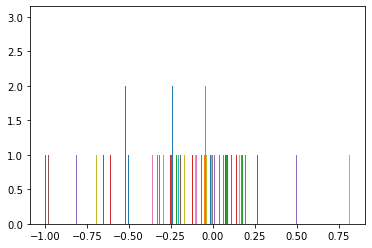

In [19]:
plt.hist(Corron200Time,50)
#plt.xlim(-0.1,0.1)

In [20]:
CorronPAN=np.zeros((41,201,GoodICFiles.shape[0]))

fig, axs = plt.subplots(6, 8,figsize=(20,18))
k=np.zeros((41))
for i in range(GoodICFiles.shape[0]):
        for j in range(41):
            if any(Corron200[i,j,:]!=np.nan) and (np.nanmax(Corron200[i,j,:])-np.nanmin(Corron200[i,j,:]))!=0:
                CorronPAN[j,:,int(k[j])]=(Corron200[i,j,:]-np.nanmin(Corron200[i,j,:]))/(np.nanmax(Corron200[i,j,:])-np.nanmin(Corron200[i,j,:]))
                axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot((Corron200[i,j,:]-np.nanmin(Corron200[i,j,:]))/(np.nanmax(Corron200[i,j,:])-np.nanmin(Corron200[i,j,:])))
                axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j]) 
                axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)
                k[j]=k[j]+1
plt.show()  

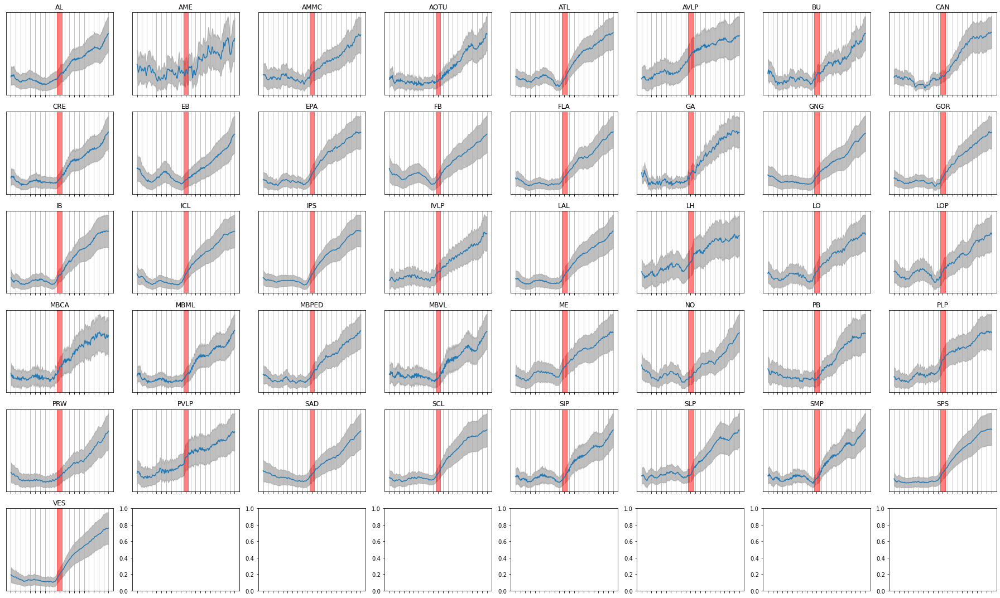

In [33]:
# Plot trial average
CorrOn=np.zeros((41,201))
d=8
fig, axs = plt.subplots(6,d,figsize=(25,15),sharex=True)
l=0
for j in range(41):
    if sum(Trials[:,j])>5:
        err=np.nanstd(Corron200Trialn[:,j,:],axis=0)/np.sqrt(sum(Trials[:,j])-1)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].plot(np.nanmean(Corron200Trialn[:,j,:],axis=0))
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(err+np.nanmean(CompCorron200n[:,j,:],axis=0))
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CompCorron200n[:,j,:],axis=0)-err)
        axs[int(np.floor(l/d)),j-int(np.floor(l/d)*d)].set_title(NameList[j])     
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between((np.nanmean(CompCorron200n[:,j,:],axis=0)-err), (np.nanmean(CompCorron200n[i,j,:],axis=0)+err),color='grey',alpha=0.5)  
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].fill_between(range(201),np.nanmean(Corron200Trialn[:,j,:],axis=0)-err,err+np.nanmean(Corron200Trialn[:,j,:],axis=0),color='grey',
                     alpha=0.5)  
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_xaxis().set_visible(False)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].get_yaxis().set_visible(False)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].axvspan(100-5, 100+5, alpha=0.5, color='red')
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].set_xticks([0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190,200])
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].set_xticklabels([])
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].xaxis.grid()
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xlim(50,151)
        for tic in axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].xaxis.get_major_ticks():
            tic.tick1On = tic.tick2On = False

        l=l+1

    #print(np.nanmax(CompCorrOnOff[j,:]))
plt.tight_layout()    
plt.savefig('Z:\GrunwaldKadow_group\Sophie\ForcedWalkProject\Figures\Figure6\Fig6PANCorrononentsTrialsAv_sup15Hz.svg')
plt.savefig('Z:\GrunwaldKadow_group\Sophie\ForcedWalkProject\Figures\Figure6\Fig6PANCorrononentsTrialsAv_sup15Hz.png')
plt.show() 


In [81]:
Compdf=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\ForcedWalkProject\Compdf.pkl")
GoodICFiles=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\ForcedWalkProject\GoodICsdf.pkl")
Regionsdf=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\ForcedWalkProject\Regionsdf.pkl")

GoodICFiles.loc[GoodICFiles.index==0,'TSlowlimForcedWalk']=0
GoodICFiles.loc[GoodICFiles.index==0,'TShighlimForcedWalk']=4999
GoodICFiles.loc[GoodICFiles.index==24,'TSlowlimForcedWalk']=2
GoodICFiles.loc[GoodICFiles.index==24,'TShighlimForcedWalk']=4998
GoodICFiles.loc[GoodICFiles.index==126,'TSlowlimForcedWalk']=1
GoodICFiles.loc[GoodICFiles.index==130,'TSlowlimForcedWalk']=1
GoodICFiles.loc[GoodICFiles.index==130,'TShighlimForcedWalk']=3000
#Regionsdf=Regionsdf.query('FR>15')
#Compdf=Compdf.query('FR>15')
#GoodICFiles=GoodICFiles.query('FR>15')

In [82]:
GoodICFiles[np.isnan(GoodICFiles['FR'])==False]['expID'].unique()

array(['216', '100761', '100762', '103', '104', '105', '100106', 'B34',
       'B35', 'B36', 'B37', 'B38', 'B39', 'B40', 'B41', 'B42', 'B43',
       'B180', 'B182', 'B183', 'B184', 'B190', 'B192', 'B193', 'B194',
       'B195', 'B196', 'B197', '100148', '100234', '100609', '981',
       'B322', 'B323', '100133', 'B993', 'B1037', 'B1047', '247', '249',
       '251', '359', '360', '369', '370', '371', '372', 'B1070', 'B1125',
       'B1126', 'B1128', 'B1129', '100160', 'B1073', 'B1075', 'B1080',
       'B1090', 'B754', 'B66', 'B68', 'B70', 'B73', 'B74', 'B75', 'B99',
       'B100', 'B167', 'B168', 'B169', 'B175', 'B176', 'B177', 'B116',
       'B117', 'B118', 'B126', 'B127', 'B128', 'B129', 'B153', 'B154',
       'B130', 'B131', 'B132', 'B133', 'B134', 'B140', 'B141', 'B1134',
       '107', '100142', '100145', '100455', '100597', '100621', 'B370',
       'B373', 'B378', '46', '47', 'B765', 'B766', 'B767', 'B768',
       'B1054', '29', '158', '167', 'B361', 'B362', '194', 'B97', 'B122',
 

(5286, 1) (75, 5286)
100160
0.0
-inf


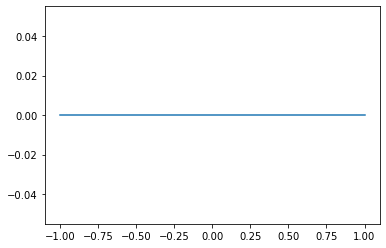

(5997, 1) (75, 5998)
B1073
165.0
0.27263721925518214


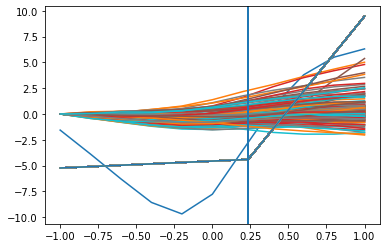

(2010, 1) (75, 2010)
B1075
9.0
0.978315778661142


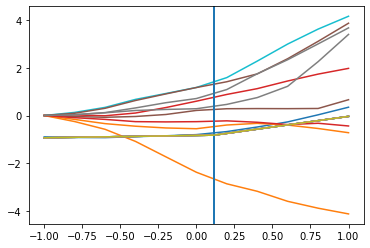

(4783, 1) (75, 4783)
B1080
42.0
0.9885117021931995


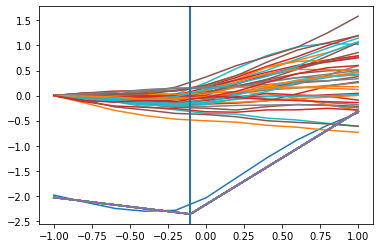

(2155, 1) (75, 2155)
B1090
37.0
0.9701668283631796


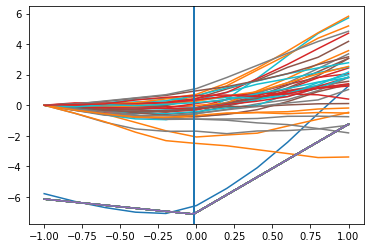

In [42]:
GoodICFiles=GoodICFiles.query('GAL4 == "Cha"')
Regionsdf=Regionsdf.query('GAL4 == "Cha"')

Corronoff200=np.zeros((GoodICFiles.shape[0],41,201))
Corroff200=np.zeros((GoodICFiles.shape[0],41,201))
Corron200=np.zeros((GoodICFiles.shape[0],41,201))
Corron200Time=np.zeros((GoodICFiles.shape[0],41))
Regionsdf['OnTime']=np.nan
Corron200Trials=np.zeros((1000,41,201))
Trials=np.zeros((GoodICFiles.shape[0],41))

xnew = np.linspace(-1, 1, num=201, endpoint=True)
k=np.zeros(41)

#for i in chain(range(134), range(135, 244), range(245, GoodICFiles.shape[0])):
for i in range(GoodICFiles.shape[0]):
    #try:
        if GoodICFiles.iloc[i]['ForcedWalkRegressor'] != '':
            if (GoodICFiles.iloc[i]['RegionFile']!=''):
                TS=loadmat(GoodICFiles.iloc[i]['RegionFile'])['TS']
            #TS=loadmat(GoodICFiles.iloc[i]['TSfile'].replace('/','\\').replace('\\media\\NAS','Z:\\GrunwaldKadow_group').replace('.mat','GoodIC.mat'))['TSgoodIC']
            else:
                continue
            try:
                Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('kd',''))['R']
            except:
                try:
                    Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('kd',''))['RForcedWalk']
                except:
                    try:
                        Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('ForcedWalkRbinkd','Rbin'))['R']
                    except:
                        try:
                            Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('Rbinkd','Rbin'))['Rbin']
                        except:
                            Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('kd',''))['Rbin']
            
            if Regressor.shape[0]<Regressor.shape[1]:
                Regressor=Regressor.T
            if TS.shape[0]>TS.shape[1]:
                TS=TS.T    
                
            print(Regressor.shape, TS.shape)   
            
            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:Regressor.shape[0]+1]
            if TS.shape[1]==(Regressor.shape[0]+1):
                TS=TS[:,0:Regressor.shape[0]]            
            if TS.shape[1]==(Regressor.shape[0]+3):
                TS=TS[:,1:Regressor.shape[0]+1]   
                
            if TS.shape[1]==(Regressor.shape[0]-1):
                Regressor=Regressor[0:Regressor.shape[0]-1]    
            if TS.shape[1]==(Regressor.shape[0]-2):
                Regressor=Regressor[1:Regressor.shape[0]-1]    
            if TS.shape[1]==(Regressor.shape[0]-3):
                Regressor=Regressor[1:Regressor.shape[0]-2] 
            if TS.shape[1]==(Regressor.shape[0]-4):
                Regressor=Regressor[2:Regressor.shape[0]-2]                  
            if TS.shape[1]==(Regressor.shape[0]-6):
                Regressor=Regressor[3:Regressor.shape[0]-3]     
            if TS.shape[1]==(Regressor.shape[0]-5):
                Regressor=Regressor[2:Regressor.shape[0]-3]                     
            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:Regressor.shape[0]+1]                 
              
            if TS.shape[1]!=(Regressor.shape[0]): 
                TS=TS[:,int(GoodICFiles.iloc[i]['TSlowlimForcedWalk']):int(GoodICFiles.iloc[i]['TShighlimForcedWalk']+1)]
                
            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:Regressor.shape[0]+1]
            if TS.shape[1]==(Regressor.shape[0]+1):
                TS=TS[:,0:Regressor.shape[0]]            
            if TS.shape[1]==(Regressor.shape[0]+3):
                TS=TS[:,1:Regressor.shape[0]+1]   
                
            if TS.shape[1]==(Regressor.shape[0]-1):
                Regressor=Regressor[0:Regressor.shape[0]-1]    
            if TS.shape[1]==(Regressor.shape[0]-2):
                Regressor=Regressor[1:Regressor.shape[0]-1]    
            if TS.shape[1]==(Regressor.shape[0]-3):
                Regressor=Regressor[1:Regressor.shape[0]-2] 
            if TS.shape[1]==(Regressor.shape[0]-4):
                Regressor=Regressor[2:Regressor.shape[0]-2]                  
            if TS.shape[1]==(Regressor.shape[0]-6):
                Regressor=Regressor[3:Regressor.shape[0]-3]     
            if TS.shape[1]==(Regressor.shape[0]-5):
                Regressor=Regressor[2:Regressor.shape[0]-3]                     
            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:Regressor.shape[0]+1]     


            
            #if len(TS)!=1 and pd.isnull(FR)==False:
            if len(TS)!=1:
                FR=GoodICFiles.iloc[i]['FR']
                print(GoodICFiles.iloc[i]['expID'])
                           
                Ron=np.zeros(len(Regressor))
                Roff=np.zeros(len(Regressor))
                for m in range(int(1*FR),int(len(Regressor)-1*FR)):
                    if Regressor[m]==1 and all(Regressor[int(m-1*FR):int(m)]==0) and (np.mean(Regressor[int(m+1):int(m+0.5*FR)])>0.5):
                        Ron[m]=1                        
                    if Regressor[m]==1 and all(Regressor[int(m+1):int(m+1*FR)]==0) and (np.mean(Regressor[int(m-0.5*FR):int(m-1)])>0.5):
                        Roff[m+1]=1                    
                print(sum(Ron))

                for j in range(75):    
                    if len(TS)==87:
                        TS2=TS
                        TS=np.zeros((75,TS.shape[1]))
                        for j in range(75):
                            TS[j,:]=TS2[T87_75[j][0]-1,:]  
                    
                    if np.isnan(np.mean(TS[j,:]))==False:
                        TS[j,:]=TS[j,:]/np.nanmax(TS[j,:])
                        Ton=[p for p in range(len(np.squeeze(Ron.T))) if Ron[p]==1]
                        
                        ## full correlation
                        Corr=np.correlate(TS[j,:],np.squeeze(Regressor.T), 'full')
                        Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
                        x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
                        Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')
                        RegName=list(Regionsdf.loc[(Regionsdf.TSfile == GoodICFiles.iloc[i]['TSfile']) & (Regionsdf.RegionNum == j)]['RegionNames'])[0]
                        
                        Corronoff200[i,NameList.index(RegName),:]=Corronoff200[i,NameList.index(RegName),:]+Corrlocint(xnew)

                        ## onset correlation
                        Corr=np.correlate(TS[j,:],np.squeeze(Ron.T), 'full')
                        #lags = scipy.signal.correlation_lags(len(TS[j,:])/FR)
                        Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
                        Corrloc50=Corr[int(((len(Corr)-1)/2)-FR):int(((len(Corr)-1)/2)+0.5*FR)+1]
                        x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
                        x50 = np.linspace(-1, 0.5, num=len(Corrloc50), endpoint=True)
                        Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')
                        
                        ## fit onset
                        y0=np.mean(Corrloc)
                        yb=np.max(Corrloc)
                        p , e = optimize.curve_fit(piecewise_linear, x50, Corrloc50,p0=[0.1,y0,0.001,yb-y0],bounds=([-0.5,y0-0.5*abs(y0)-1,-1,(yb-y0)-abs(yb-y0)-1],[0.5,(y0+0.5*abs(y0))+1,1,(yb-y0)+abs(yb-y0)+1]),method='trf')
                        residuals = Corrloc50- piecewise_linear(x50, *p)
                        ss_res = np.sum(residuals**2)
                        ss_tot = np.sum((Corrloc50-np.mean(Corrloc50))**2)
                        r_squared = 1 - (ss_res / ss_tot)
                        
                        Corron200[i,NameList.index(RegName),:]=Corron200[i,NameList.index(RegName),:]+Corrlocint(xnew)
                        Regionsdf.loc[(Regionsdf.TSfile == GoodICFiles.iloc[i]['TSfile']) & (Regionsdf.RegionNum == j),'OnTime']=p[0]
                        
                        if r_squared>0.9:
                            Corron200Time[i,NameList.index(RegName)]=Corron200Time[i,NameList.index(RegName)]+p[0]
                        
                        if j==20:
                            print(r_squared)
                            plt.plot(x,Corrloc)                            
                        ## get peri-onset time series per trial
                        for l in range(int(sum(Ron))):
                            Tloc=TS[j,int(Ton[l]-FR):int(Ton[l]+FR+1)]
                            #x = np.linspace(-1, 1, num=len(Tloc), endpoint=True)
                            Tlocint=scipy.interpolate.interp1d(x,Tloc, kind='cubic')
                            Corron200Trials[int(k[NameList.index(RegName)]+l),NameList.index(RegName),:]=Tlocint(xnew)   
                            Trials[i,NameList.index(RegName)]=sum(Ron)   
                            if j==20:
                                plt.plot(x,(Tloc-Tloc[0])*10)
                                plt.axvline(x=p[0])
                                xd = np.linspace(-1, 1, 100)
                                plt.plot(xd, piecewise_linear(xd, *p))
                        plt.show()   
                        k[NameList.index(RegName)]=k[NameList.index(RegName)]+sum(Ron)
                        Corr=np.correlate(TS[j,:],np.squeeze(Roff.T), 'full')
                        Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
                        x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
                        Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')
                        RegName=list(Regionsdf.loc[(Regionsdf.TSfile == GoodICFiles.iloc[i]['TSfile']) & (Regionsdf.RegionNum == j)]['RegionNames'])[0]
                        Corroff200[i,NameList.index(RegName),:]=Corroff200[i,NameList.index(RegName),:]+Corrlocint(xnew)

                del TS
                
   # except:
      #   continue   


Corron200Time[i,NameList.index(RegName)]=Corron200Time[i,NameList.index(RegName)]/(k[NameList.index(RegName)]+1)

np.save('ChaCorron200Time.npy',Corron200Time)
np.save('ChaCorron200.npy',Corron200)

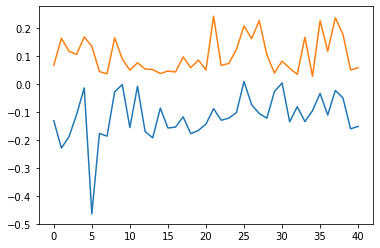

In [47]:
Corron200Time=np.load('ChaCorron200Time.npy')
Corron200=np.load('ChaCorron200.npy')

Corron200Time[Corron200Time==0]=np.nan

plt.plot(np.nanmean(Corron200Time,axis=0))
plt.plot(np.nanstd(Corron200Time,axis=0))
#plt.xlabel(NamesList)

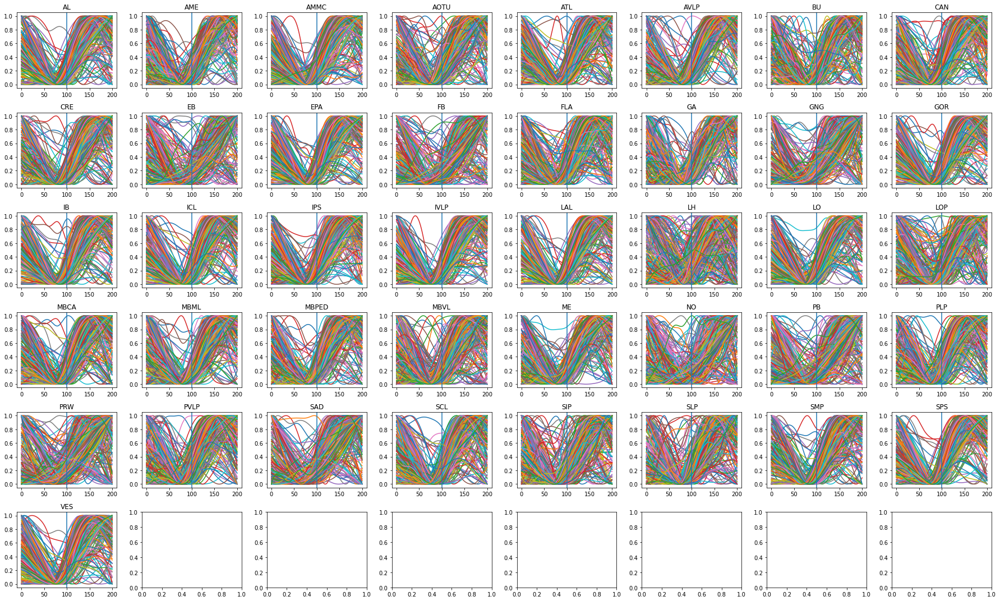

In [48]:
Corron200n=np.zeros((GoodICFiles.shape[0],41,201))
Corron200Trialn=np.zeros((int(max(sum(Trials))),41,201))
FRs=np.zeros((GoodICFiles.shape[0],87))

# Plot all trials
CorrOn=np.zeros((41,201))
fig, axs = plt.subplots(6, 8,figsize=(25,15))
for j in range(41):
    for k in range((int(max(sum(Trials))))):
        C=Corron200Trials[k,j,:]
        if (np.nanmax(C)-np.nanmin(C))!=0:
            Corron200Trialn[k,j,:]=(C-np.nanmin(C))/(np.nanmax(C)-np.nanmin(C))            
            axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(Corron200Trialn[k,j,:])
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j]) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)

#    except:
  #       continue   
plt.tight_layout()
plt.show()

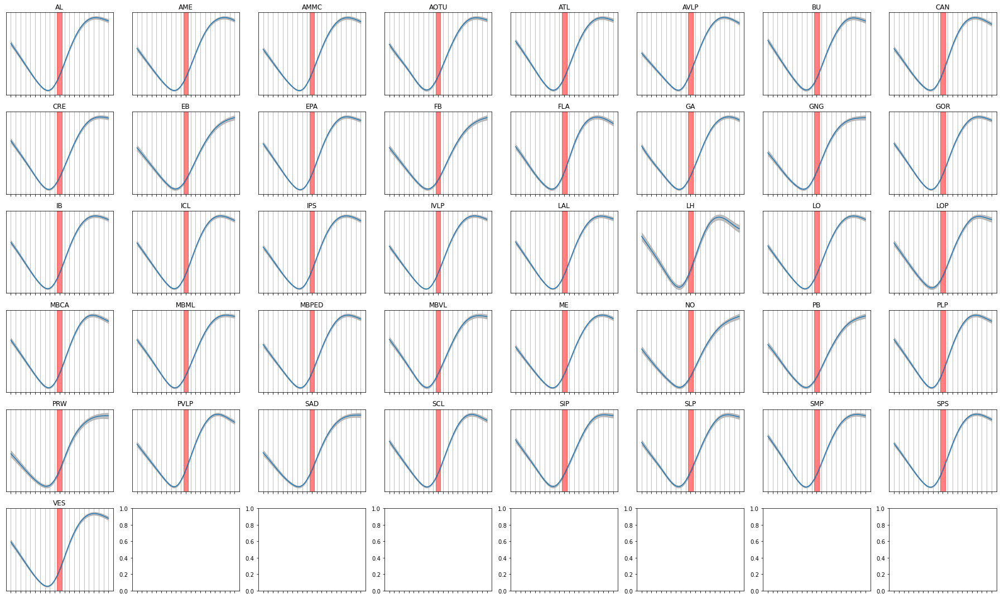

In [49]:
# Plot trial average
CorrOn=np.zeros((41,201))
d=8
fig, axs = plt.subplots(6,d,figsize=(25,15),sharex=True)
l=0
for j in range(41):
    if sum(Trials[:,j])>5:
        err=np.nanstd(Corron200Trialn[:,j,:],axis=0)/np.sqrt(sum(Trials[:,j])-1)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].plot(np.nanmean(Corron200Trialn[:,j,:],axis=0))
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(err+np.nanmean(CompCorron200n[:,j,:],axis=0))
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CompCorron200n[:,j,:],axis=0)-err)
        axs[int(np.floor(l/d)),j-int(np.floor(l/d)*d)].set_title(NameList[j])     
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between((np.nanmean(CompCorron200n[:,j,:],axis=0)-err), (np.nanmean(CompCorron200n[i,j,:],axis=0)+err),color='grey',alpha=0.5)  
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].fill_between(range(201),np.nanmean(Corron200Trialn[:,j,:],axis=0)-err,err+np.nanmean(Corron200Trialn[:,j,:],axis=0),color='grey',
                     alpha=0.5)  
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_xaxis().set_visible(False)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].get_yaxis().set_visible(False)
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].axvspan(100-5, 100+5, alpha=0.5, color='red')
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].set_xticks([0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190,200])
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].set_xticklabels([])
        axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].xaxis.grid()
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xlim(50,151)
        for tic in axs[int(np.floor(l/d)),l-int(np.floor(l/d)*d)].xaxis.get_major_ticks():
            tic.tick1On = tic.tick2On = False

        l=l+1

    #print(np.nanmax(CompCorrOnOff[j,:]))
plt.tight_layout()    
plt.savefig('Z:\GrunwaldKadow_group\Sophie\ForcedWalkProject\Figures\Figure6\Fig6ChaCorrononentsTrialsAv.svg')
plt.savefig('Z:\GrunwaldKadow_group\Sophie\ForcedWalkProject\Figures\Figure6\Fig6ChaCorrononentsTrialsAv.png')
plt.show() 

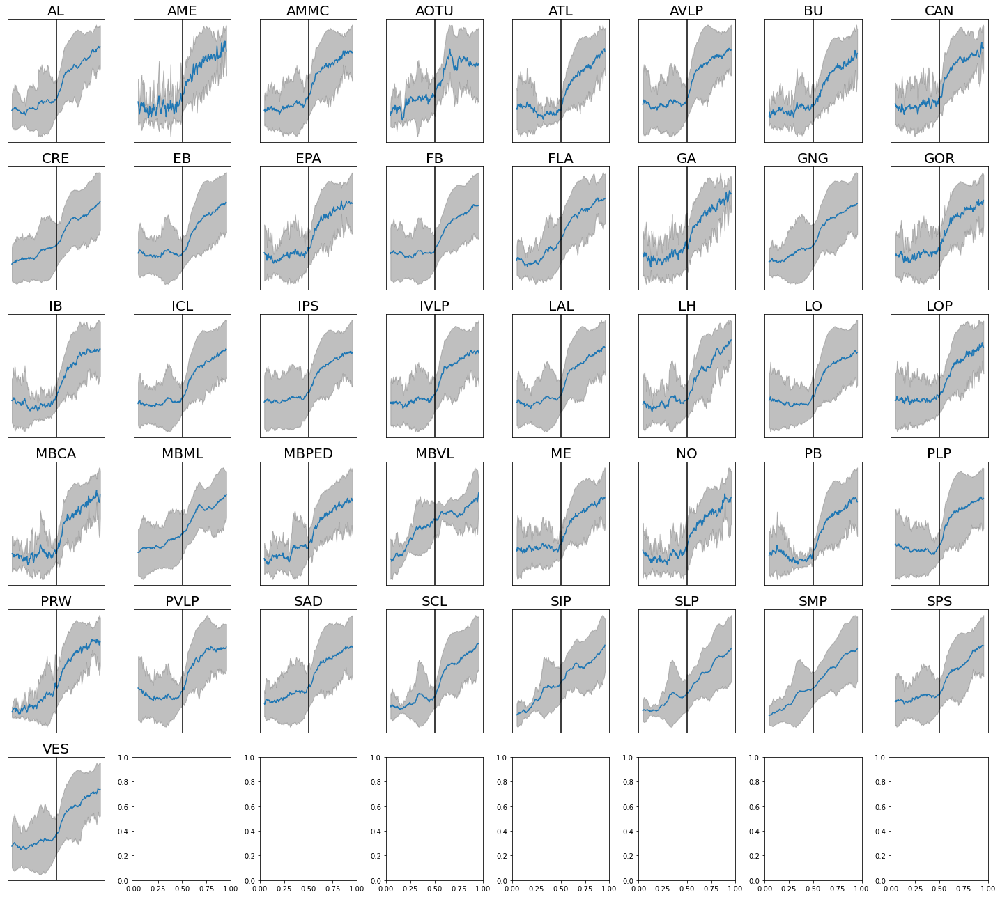

In [27]:
fig, axs = plt.subplots(6, 8,figsize=(20,18))
for j in range(41):
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CorronTH[j,:,:],axis=1))
    err=np.nanstd(CorronTH[j,:,:],axis=1)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j],size=20) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100, color='black')
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between(range(200),np.nanmean(CorronTH[j,:,:],axis=1)-err, np.nanmean(CorronTH[j,:,:],axis=1)+err,color='grey',
                 alpha=0.5)  
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].get_xaxis().set_visible(False)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].get_yaxis().set_visible(False)
plt.tight_layout()
plt.savefig('Z:\GrunwaldKadow_group\Sophie\ForcedWalkProject\Figures\Figure6\CorronTH_sup20Hz.svg')
plt.show()  

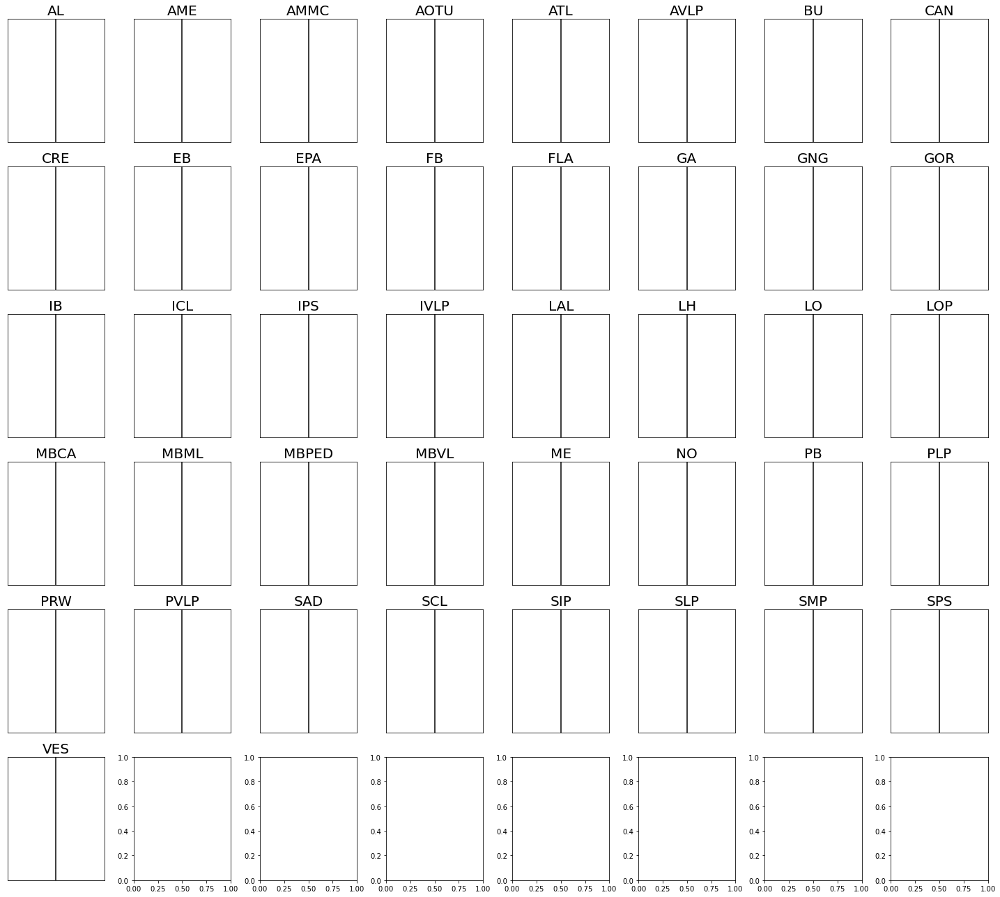

In [28]:
fig, axs = plt.subplots(6, 8,figsize=(20,18))
for j in range(41):
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CorronTDC[j,:,:],axis=1))
    err=np.nanstd(CorronTDC[j,:,:],axis=1)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j],size=20) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100, color='black')
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between(range(200),np.nanmean(CorronTDC[j,:,:],axis=1)-err, np.nanmean(CorronTDC[j,:,:],axis=1)+err,color='grey',
                 alpha=0.5)  
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].get_xaxis().set_visible(False)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].get_yaxis().set_visible(False)
plt.tight_layout()
plt.savefig('Z:\GrunwaldKadow_group\Sophie\ForcedWalkProject\Figures\Figure6\CorronTDC_sup20Hz.svg')
plt.show()  

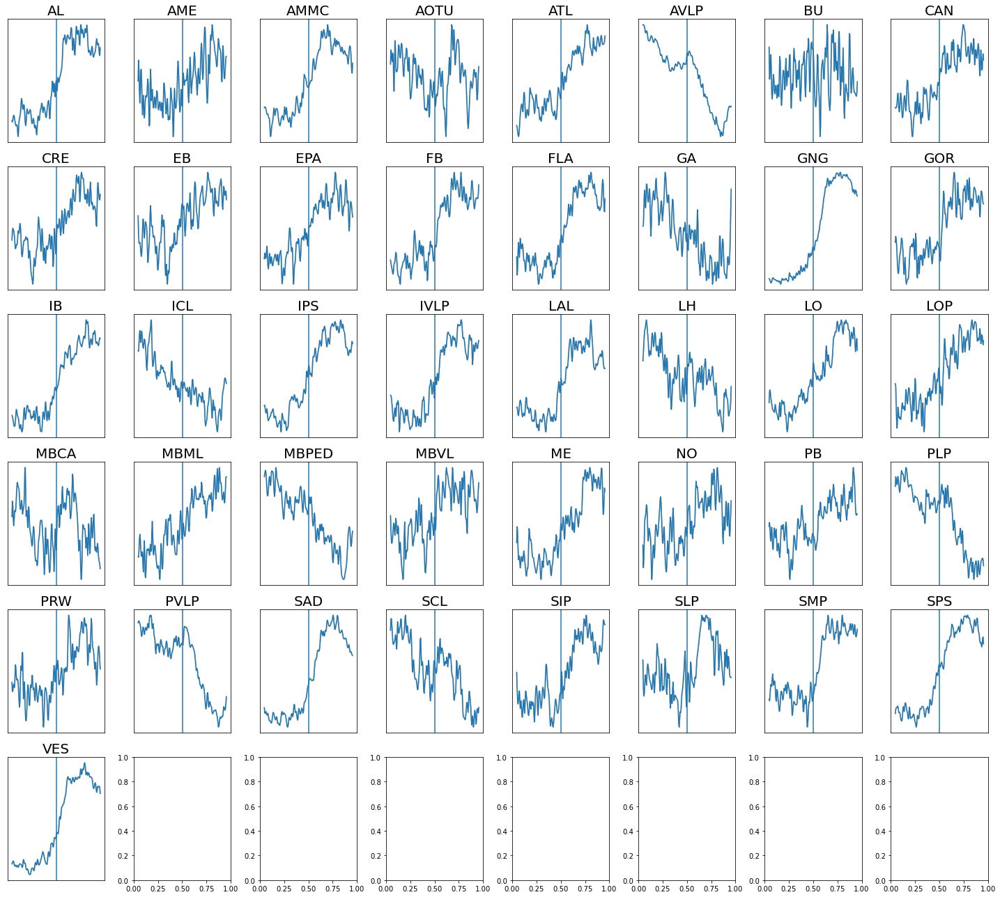

In [29]:
fig, axs = plt.subplots(6, 8,figsize=(20,18))
for j in range(41):
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CorronTrh[j,:,:],axis=1))
    err=np.nanstd(CorronTrh[j,:,:],axis=1)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j],size=20) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between(range(200),np.nanmean(CorronTrh[j,:,:],axis=1)-err, np.nanmean(CorronTrh[j,:,:],axis=1)+err,color='grey',
                 alpha=0.5)  
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].get_xaxis().set_visible(False)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].get_yaxis().set_visible(False)
plt.tight_layout()
plt.savefig('Z:\GrunwaldKadow_group\Sophie\ForcedWalkProject\Figures\Figure6\CorronTrh_sup20Hz.svg')
plt.show()  

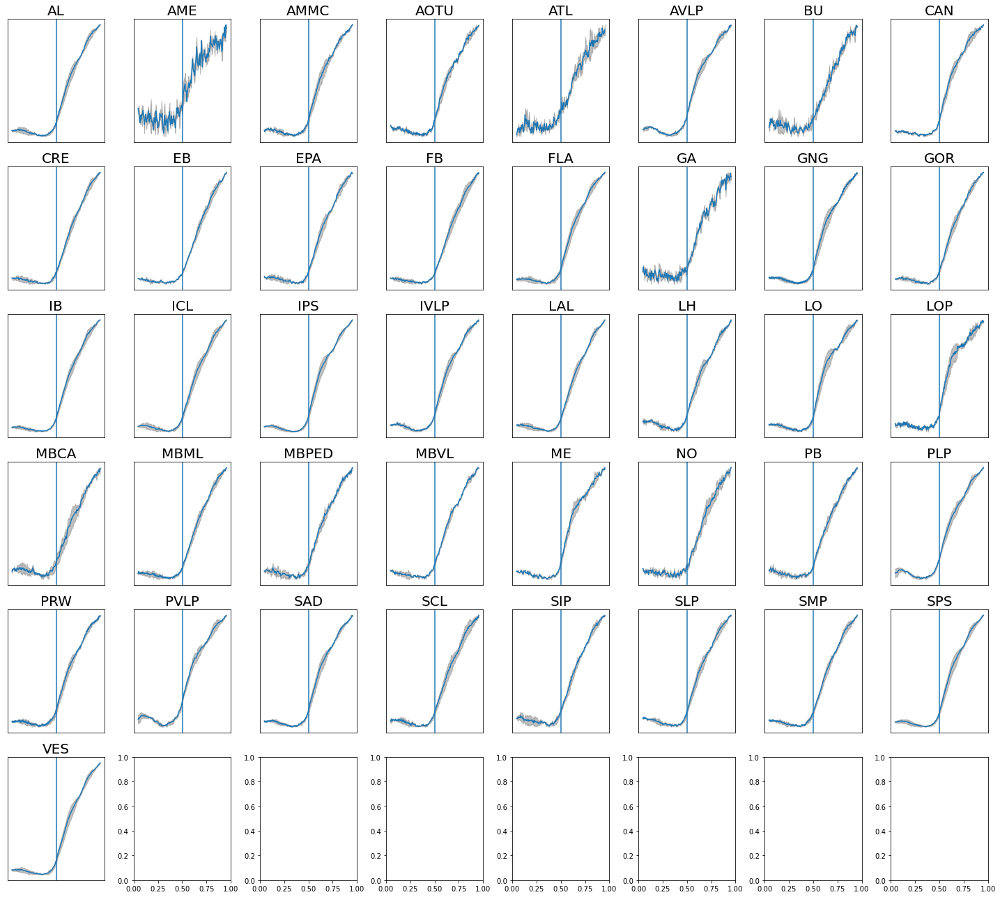

In [30]:
fig, axs = plt.subplots(6, 8,figsize=(20,18))
for j in range(41):
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CorronGad[j,:,:],axis=1))
    err=np.nanstd(CorronGad[j,:,:],axis=1)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j],size=20) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between(range(200),np.nanmean(CorronGad[j,:,:],axis=1)-err, np.nanmean(CorronGad[j,:,:],axis=1)+err,color='grey',
                 alpha=0.5)  
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].get_xaxis().set_visible(False)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].get_yaxis().set_visible(False)
plt.savefig('Z:\GrunwaldKadow_group\Sophie\ForcedWalkProject\Figures\Figure6\CorronGad_sup20Hz.svg')
plt.tight_layout()
plt.show()  

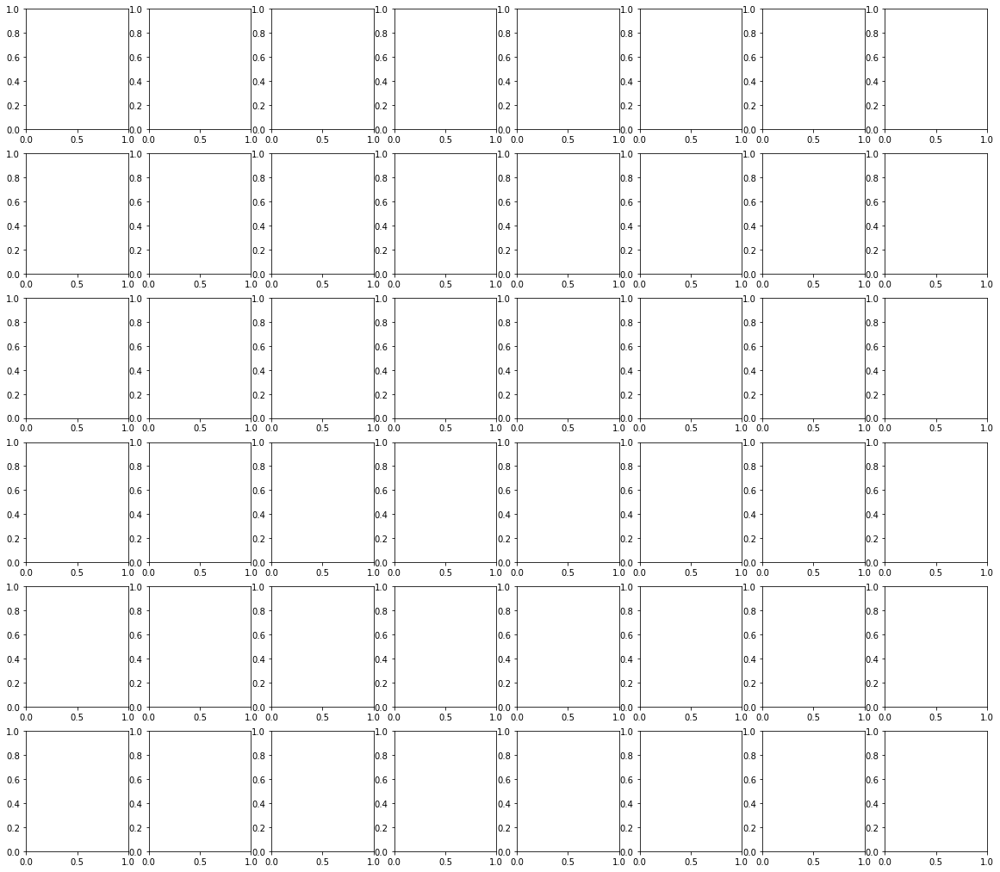

In [31]:
fig, axs = plt.subplots(6, 8,figsize=(20,18))
CorronCha=np.zeros((41,200,GoodICFiles.shape[0]))
CorronCha[:,:,:]=np.nan
k=np.zeros((41))
for i in range(GoodICFiles.shape[0]):
        if (GoodICFiles.iloc[i]['GAL4'] == 'Cha') :
            for j in range(41):
                if any(Corron200[i,j,:]!=np.nan) and (np.nanmax(Corron200[i,j,:])-np.nanmin(Corron200[i,j,:]))!=0:
                    CorronCha[j,:,int(k[j])]=(Corron200[i,j,:]-np.nanmin(Corron200[i,j,:]))/(np.nanmax(Corron200[i,j,:])-np.nanmin(Corron200[i,j,:]))
                    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot((Corron200[i,j,:]-np.nanmin(Corron200[i,j,:]))/(np.nanmax(Corron200[i,j,:])-np.nanmin(Corron200[i,j,:])))
                    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j]) 
                    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)
                    k[j]=k[j]+1
plt.show()  

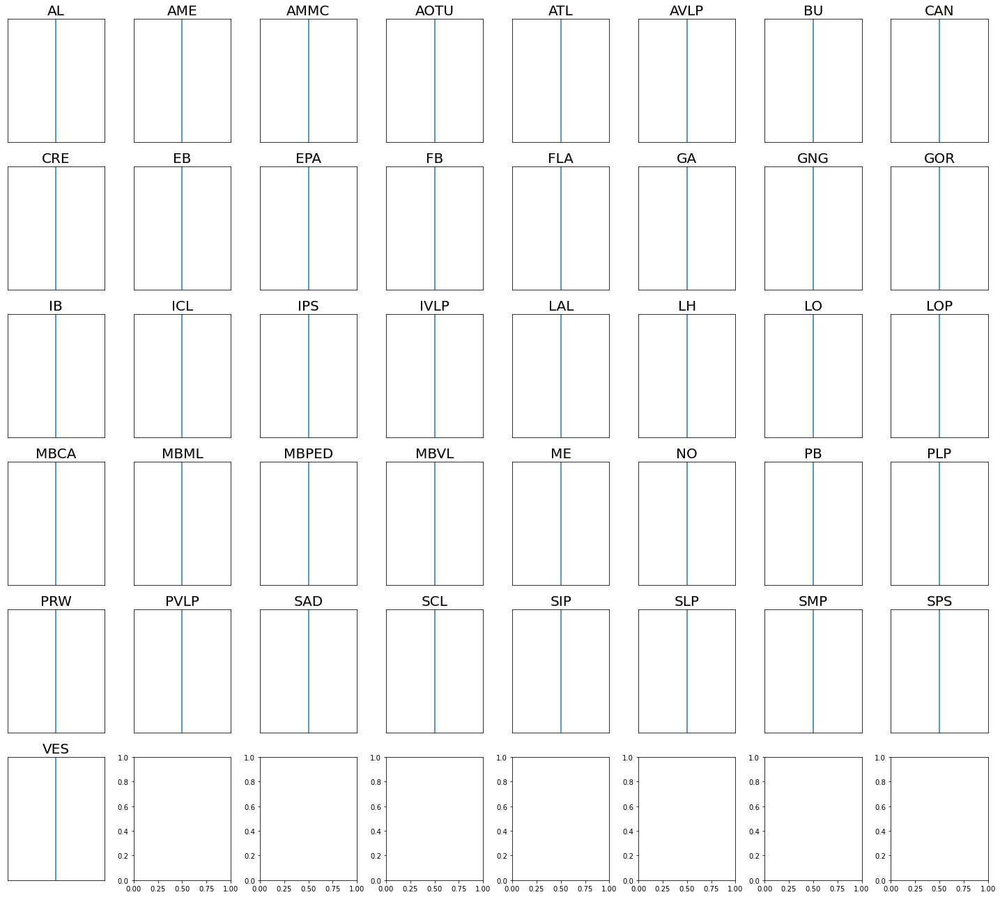

In [32]:
fig, axs = plt.subplots(6, 8,figsize=(20,18))
for j in range(41):
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CorronCha[j,:,:],axis=1))
    err=np.nanstd(CorronCha[j,:,:],axis=1)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j],size=20) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between(range(200),np.nanmean(CorronCha[j,:,:],axis=1)-err, np.nanmean(CorronCha[j,:,:],axis=1)+err,color='grey',
                 alpha=0.5)  
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].get_xaxis().set_visible(False)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].get_yaxis().set_visible(False)
plt.tight_layout()
plt.savefig('Z:\GrunwaldKadow_group\Sophie\ForcedWalkProject\Figures\Figure6\CorronCha_sup20Hz.svg')
plt.show()  

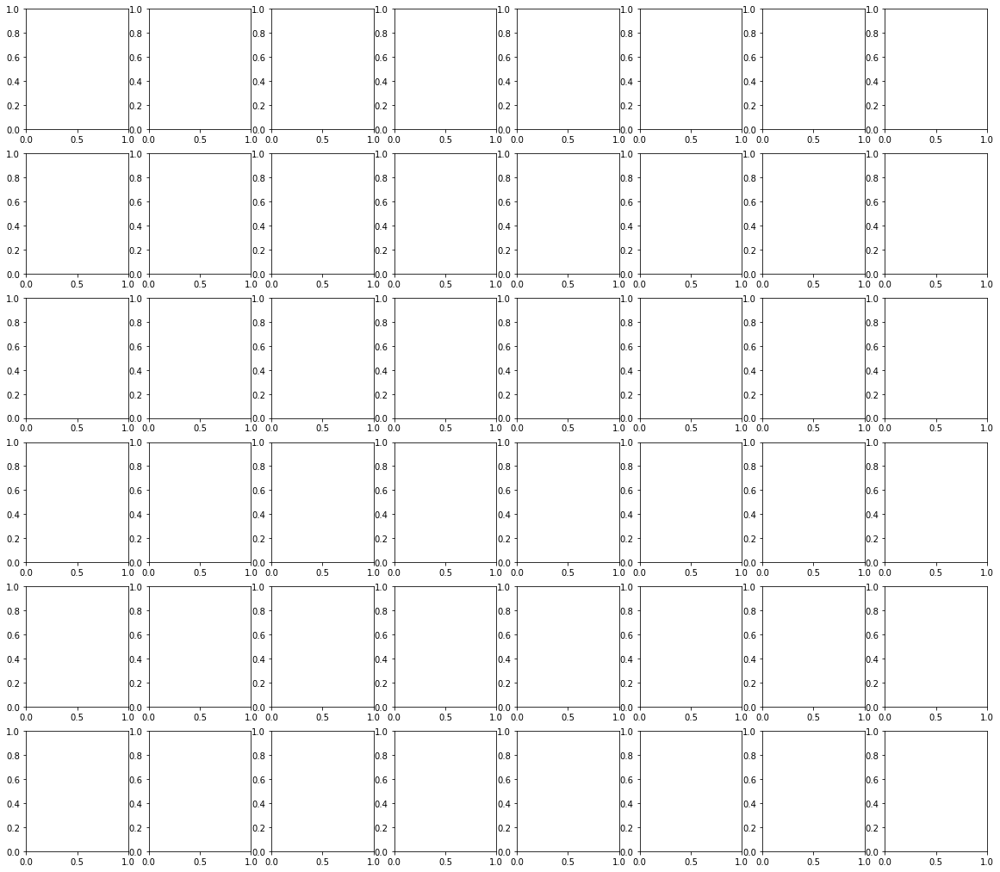

In [33]:
fig, axs = plt.subplots(6, 8,figsize=(20,18))
CorronVglut=np.zeros((41,200,GoodICFiles.shape[0]))
CorronVglut[:,:,:]=np.nan
k=np.zeros((41))
for i in range(GoodICFiles.shape[0]):
        if (GoodICFiles.iloc[i]['GAL4'] == 'Vglut') :
            for j in range(41):
                if any(Corron200[i,j,:]!=np.nan) and (np.nanmax(Corron200[i,j,:])-np.nanmin(Corron200[i,j,:]))!=0:
                    CorronVglut[j,:,int(k[j])]=(Corron200[i,j,:]-np.nanmin(Corron200[i,j,:]))/(np.nanmax(Corron200[i,j,:])-np.nanmin(Corron200[i,j,:]))
                    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot((Corron200[i,j,:]-np.nanmin(Corron200[i,j,:]))/(np.nanmax(Corron200[i,j,:])-np.nanmin(Corron200[i,j,:])))
                    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j]) 
                    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)
                    k[j]=k[j]+1
plt.show()  

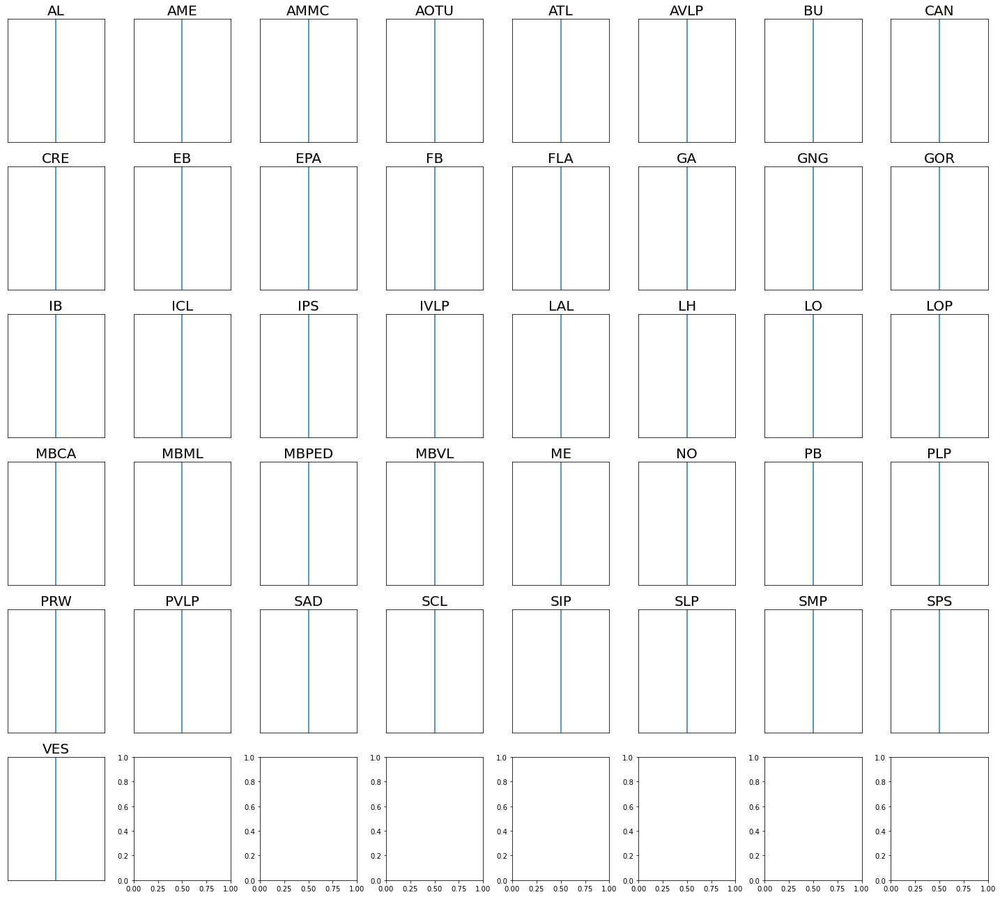

In [34]:
fig, axs = plt.subplots(6, 8,figsize=(20,18))
for j in range(41):
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CorronVglut[j,:,:],axis=1))
    err=np.nanstd(CorronVglut[j,:,:],axis=1)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].set_title(NameList[j],size=20) 
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=100)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between(range(200),np.nanmean(CorronVglut[j,:,:],axis=1)-err, np.nanmean(CorronVglut[j,:,:],axis=1)+err,color='grey',
                 alpha=0.5)  
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].get_xaxis().set_visible(False)
    axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].get_yaxis().set_visible(False)
plt.tight_layout()
plt.savefig('Z:\GrunwaldKadow_group\Sophie\ForcedWalkProject\Figures\Figure6\CorronVglut_sup20Hz.svg')
plt.show()  

In [ ]:
DeltaTime=np.zeros((271,41))
k=np.zeros((41))
for i in range(GoodICFiles.shape[0]):
    for j in range(41):
        DeltaTime[i,j]=Corron200Time[i,j]-Corron200Time[i,14]
    if np.mean(DeltaTime[i,j])<0:
        print(GoodICFiles.iloc[i]['GAL4'])
DeltaTime[DeltaTime==0]=np.nan        
plt.hist(DeltaTime)

In [5]:
Compdf=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\WalkProject\Compdf.pkl")
GoodICFiles=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\WalkProject\GoodICsdf.pkl")
Regionsdf=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\WalkProject\Regionsdf.pkl")
CompOrder=pd.read_csv('Z:\GrunwaldKadow_group\Sophie\WalkProject\AllCompIDOrderedVF.txt',header=None)

In [11]:
GoodICFiles.loc[GoodICFiles.index==24,'TSlowlimWalk']=2
GoodICFiles.loc[GoodICFiles.index==24,'TShighlimWalk']=4998
GoodICFiles.loc[GoodICFiles.index==55,'FR']=50
GoodICFiles.loc[GoodICFiles.index==62,'FR']=20
GoodICFiles.loc[GoodICFiles.index==66,'FR']=20
GoodICFiles.loc[GoodICFiles.index==68,'FR']=20
GoodICFiles.loc[GoodICFiles.index==71,'TSlowlimWalk']=3000
GoodICFiles.loc[GoodICFiles.index==71,'TShighlimWalk']=5999
GoodICFiles.loc[GoodICFiles.index==71,'FR']=10
GoodICFiles.loc[GoodICFiles.index==72,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==72,'TShighlimWalk']=2000
GoodICFiles.loc[GoodICFiles.index==72,'FR']=10
GoodICFiles.loc[GoodICFiles.index==73,'FR']=5
GoodICFiles.loc[GoodICFiles.index==75,'FR']=10
GoodICFiles.loc[GoodICFiles.index==76,'FR']=10
GoodICFiles.loc[GoodICFiles.index==88,'TSlowlimWalk']=600
GoodICFiles.loc[GoodICFiles.index==88,'TShighlimWalk']=1500
GoodICFiles.loc[GoodICFiles.index==88,'FR']=10
GoodICFiles.loc[GoodICFiles.index==89,'FR']=10
GoodICFiles.loc[GoodICFiles.index==180,'FR']=10
GoodICFiles.loc[GoodICFiles.index==88,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==88,'TShighlimWalk']=500

GoodICFiles.loc[GoodICFiles.index==126,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==130,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==130,'TShighlimWalk']=3000

GoodICFiles.loc[GoodICFiles.index==89,'FR']=10
GoodICFiles.loc[GoodICFiles.index==167,'FR']=100
GoodICFiles.loc[GoodICFiles.index==168,'FR']=100
GoodICFiles.loc[GoodICFiles.index==180,'FR']=10
GoodICFiles.loc[GoodICFiles.index==181,'WalkRegressor']='Z:\\GrunwaldKadow_group\\Sophie\\WalkProject\\TH\\B369-B380\\Fly1\\B378_1_500Forcedkd.mat'
GoodICFiles.loc[GoodICFiles.index==192,'FR']=10
GoodICFiles.loc[GoodICFiles.index==199,'ForcedWalkRegressor']='Z:\\GrunwaldKadow_group\\Sophie\\WalkProject\\TH\\B361-B362-forced\\B362_1_950Forcedkd.mat'
GoodICFiles.loc[GoodICFiles.index==199,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==199,'TShighlimWalk']=950
GoodICFiles.loc[GoodICFiles.index==213,'FR']=50
GoodICFiles.loc[GoodICFiles.index==217,'FR']=5
GoodICFiles.loc[GoodICFiles.index==220,'FR']=5
GoodICFiles.loc[GoodICFiles.index==221,'FR']=200
GoodICFiles.loc[GoodICFiles.index==222,'FR']=10
GoodICFiles.loc[GoodICFiles.index==223,'FR']=10
GoodICFiles.loc[GoodICFiles.index==224,'FR']=10
GoodICFiles.loc[GoodICFiles.index==225,'FR']=10

GoodICFiles.loc[GoodICFiles.index==228,'TSlowlimWalk']=250
GoodICFiles.loc[GoodICFiles.index==228,'TShighlimWalk']=250+1719
GoodICFiles.loc[GoodICFiles.index==228,'FR']=5
GoodICFiles.loc[GoodICFiles.index==230,'TSlowlimWalk']=600
GoodICFiles.loc[GoodICFiles.index==230,'TShighlimWalk']=1500

GoodICFiles.loc[GoodICFiles.index==233,'TSlowlimWalk']=1474
GoodICFiles.loc[GoodICFiles.index==233,'TShighlimWalk']=2800
GoodICFiles.loc[GoodICFiles.index==235,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==235,'TShighlimWalk']=350
GoodICFiles.loc[GoodICFiles.index==247,'FR']=5
GoodICFiles.loc[GoodICFiles.index==255,'FR']=5
GoodICFiles.loc[GoodICFiles.index==256,'TSlowlimWalk']=650
GoodICFiles.loc[GoodICFiles.index==256,'TShighlimWalk']=1950
GoodICFiles.loc[GoodICFiles.index==256,'FR']=5
GoodICFiles.loc[GoodICFiles.index==260,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==260,'TShighlimWalk']=350
GoodICFiles.loc[GoodICFiles.index==260,'FR']=5
GoodICFiles.loc[GoodICFiles.index==261,'FR']=5
GoodICFiles.loc[GoodICFiles.index==261,'TSlowlimWalk']=500
GoodICFiles.loc[GoodICFiles.index==261,'TShighlimWalk']=1035
GoodICFiles.loc[GoodICFiles.index==262,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==262,'TShighlimWalk']=600
GoodICFiles.loc[GoodICFiles.index==262,'FR']=5



In [6]:
TS=loadmat(GoodICFiles.iloc[10]['TSfile'].replace('/','\\').replace('\\media\\NAS','Z:\\GrunwaldKadow_group').replace('.mat','GoodIC.mat'))['TSgoodIC']
            

In [8]:
np.std(TS[0,:])

0.2076176875054932

In [7]:
TS.shape

(16, 5889)

In [15]:
for i in range(91,GoodICFiles.shape[0]):
#for i in range(228,229):
#for i in range(262,GoodICFiles.shape[0]):
   # try:
        if GoodICFiles.iloc[i]['ForcedWalkRegressor'] != '':
            TS=loadmat(GoodICFiles.iloc[i]['TSfile'].replace('/','\\').replace('\\media\\NAS','Z:\\GrunwaldKadow_group').replace('.mat','GoodIC.mat'))['TSgoodIC']
            
            print(GoodICFiles.iloc[i]['TSfile'])
            print(TS.shape[1]) 
            print(GoodICFiles.iloc[i]['ForcedWalkRegressor'])          
            
            try:
                Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('kd',''))['R']
            except:
                try:
                    Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('kd',''))['RForcedWalk']
                except:
                    try:
                        Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('ForcedWalkRbinkd','Rbin'))['R']
                    except:
                        try:
                            Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('Rbinkd','Rbin'))['Rbin']
                        except:
                            Regressor =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('kd',''))['Rbin']
            print(Regressor.shape)

            if Regressor.shape[0]<Regressor.shape[1]:
                Regressor=Regressor.T
            if TS.shape[0]>TS.shape[1]:
                TS=TS.T   
 
            print(GoodICFiles.iloc[i]['TSfile'])
            print(TS.shape[1]) 
            print(GoodICFiles.iloc[i]['ForcedWalkRegressor'])
            print(Regressor.shape[0])                 
            
            # processed time series have 2 less time points from kalman filter processing, sometimes 2 less from dff, and sometimes one time point difference from triggering imprecisions.
            # when regressors are obtained from combined stack, it is the reverse
            
            if TS.shape[1]==(Regressor.shape[0]-1):
                Regressor=Regressor[1:Regressor.shape[0]]                          
            if TS.shape[1]==(Regressor.shape[0]-2):
                Regressor=Regressor[1:Regressor.shape[0]-1]   
            if TS.shape[1]==(Regressor.shape[0]-3):
                Regressor=Regressor[2:Regressor.shape[0]-1]                
            if TS.shape[1]==(Regressor.shape[0]-4):
                Regressor=Regressor[2:Regressor.shape[0]-2]                
            if TS.shape[1]==(Regressor.shape[0]-5):
                Regressor=Regressor[3:Regressor.shape[0]-2]                

            if TS.shape[1]==(Regressor.shape[0]+1):
                TS=TS[:,1:TS.shape[1]] 
            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:TS.shape[1]-1]      
            if TS.shape[1]==(Regressor.shape[0]+3):
                TS=TS[:,2:TS.shape[1]-1]               

 
            
            if TS.shape[1]!=(Regressor.shape[0]): 
                TS=TS[:,int(GoodICFiles.iloc[i]['TSlowlimWalk']):int(GoodICFiles.iloc[i]['TShighlimWalk']+1)]      
                
            print(GoodICFiles.iloc[i]['TSfile'])
            print(TS.shape[1]) 
            print(GoodICFiles.iloc[i]['WalkRegressor'])
            print(Regressor.shape[0])                  
                

            FR=GoodICFiles.iloc[i]['FR']
            print(FR)
            #if len(TS)!=1 and pd.isnull(FR)==False:
            if len(TS)!=1:
                print(GoodICFiles.iloc[i]['expID'])

                Ron=np.zeros(len(Regressor))
                Roff=np.zeros(len(Regressor))
                for m in range(int(2*FR),int(len(Regressor)-1*FR)):
                    if Regressor[m]==1 and all(Regressor[int(m-2*FR):int(m)]==0) and (np.mean(Regressor[int(m+1):int(m+FR)])>0.4):
                        Ron[m]=1                        
                    if Regressor[m]==1 and all(Regressor[int(m+1):int(m+1*FR)]==0) and (np.mean(Regressor[int(m-1*FR):int(m-1)])>0.4):
                        Roff[m+1]=1                    


                savemat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('.mat','Ron_and_Roff_2spre.mat'),{"Ron": Ron, "Roff": Roff})


   # except:
      #   continue   
                    # Regress here, cross corr...

/media/NAS/Sophie/WalkProject/TH/B369-B380/Fly2/DataB377ss1reg120TS.mat
1692
Z:\GrunwaldKadow_group\Sophie\WalkProject\TH\B369-B380\Fly2\B377Forcedbinkd.mat
(1692, 1)
/media/NAS/Sophie/WalkProject/TH/B369-B380/Fly2/DataB377ss1reg120TS.mat
1692
Z:\GrunwaldKadow_group\Sophie\WalkProject\TH\B369-B380\Fly2\B377Forcedbinkd.mat
1692
/media/NAS/Sophie/WalkProject/TH/B369-B380/Fly2/DataB377ss1reg120TS.mat
1692

1692
10.0
B377
/media/NAS/Sophie/WalkProject/TH/B369-B380/Fly1/DataB378ss1reg134TS.mat
3349
Z:\GrunwaldKadow_group\Sophie\WalkProject\TH\B369-B380\Fly1\B378_1_1700Forcedkd.mat
(1700, 1)
/media/NAS/Sophie/WalkProject/TH/B369-B380/Fly1/DataB378ss1reg134TS.mat
3349
Z:\GrunwaldKadow_group\Sophie\WalkProject\TH\B369-B380\Fly1\B378_1_1700Forcedkd.mat
1700
/media/NAS/Sophie/WalkProject/TH/B369-B380/Fly1/DataB378ss1reg134TS.mat
1700
Z:\GrunwaldKadow_group\Sophie\WalkProject\TH\B369-B380\Fly1\B378_1_500Forcedkd.mat
1700
10.0
B378
/media/NAS/Sophie/WalkProject/TH/B764-b768-forced/DataB765ss1reg10

In [16]:
i

270

# Get single trials

In [17]:
Compdf=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\WalkProject\Compdf.pkl")
GoodICFiles=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\WalkProject\GoodICsdf.pkl")
Regionsdf=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\WalkProject\Regionsdf.pkl")
CompOrder=pd.read_csv('Z:\GrunwaldKadow_group\Sophie\WalkProject\AllCompIDOrderedVF.txt',header=None)

In [18]:
GoodICFiles.loc[GoodICFiles.index==24,'TSlowlimWalk']=2
GoodICFiles.loc[GoodICFiles.index==24,'TShighlimWalk']=4998
GoodICFiles.loc[GoodICFiles.index==55,'FR']=50
GoodICFiles.loc[GoodICFiles.index==62,'FR']=20
GoodICFiles.loc[GoodICFiles.index==66,'FR']=20
GoodICFiles.loc[GoodICFiles.index==68,'FR']=20
GoodICFiles.loc[GoodICFiles.index==71,'TSlowlimWalk']=3000
GoodICFiles.loc[GoodICFiles.index==71,'TShighlimWalk']=5999
GoodICFiles.loc[GoodICFiles.index==71,'FR']=10
GoodICFiles.loc[GoodICFiles.index==72,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==72,'TShighlimWalk']=2000
GoodICFiles.loc[GoodICFiles.index==72,'FR']=10
GoodICFiles.loc[GoodICFiles.index==73,'FR']=5
GoodICFiles.loc[GoodICFiles.index==75,'FR']=10
GoodICFiles.loc[GoodICFiles.index==76,'FR']=10
GoodICFiles.loc[GoodICFiles.index==88,'TSlowlimWalk']=600
GoodICFiles.loc[GoodICFiles.index==88,'TShighlimWalk']=1500
GoodICFiles.loc[GoodICFiles.index==88,'FR']=10
GoodICFiles.loc[GoodICFiles.index==89,'FR']=10
GoodICFiles.loc[GoodICFiles.index==180,'FR']=10
GoodICFiles.loc[GoodICFiles.index==88,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==88,'TShighlimWalk']=500
GoodICFiles.loc[GoodICFiles.index==126,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==130,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==130,'TShighlimWalk']=3000
GoodICFiles.loc[GoodICFiles.index==89,'FR']=10
GoodICFiles.loc[GoodICFiles.index==167,'FR']=100
GoodICFiles.loc[GoodICFiles.index==168,'FR']=100
GoodICFiles.loc[GoodICFiles.index==180,'FR']=10
GoodICFiles.loc[GoodICFiles.index==181,'WalkRegressor']='Z:\\GrunwaldKadow_group\\Sophie\\WalkProject\\TH\\B369-B380\\Fly1\\B378_1_500Forcedkd.mat'
GoodICFiles.loc[GoodICFiles.index==192,'FR']=10
GoodICFiles.loc[GoodICFiles.index==199,'ForcedWalkRegressor']='Z:\\GrunwaldKadow_group\\Sophie\\WalkProject\\TH\\B361-B362-forced\\B362_1_950Forcedkd.mat'
GoodICFiles.loc[GoodICFiles.index==199,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==199,'TShighlimWalk']=950
GoodICFiles.loc[GoodICFiles.index==213,'FR']=50
GoodICFiles.loc[GoodICFiles.index==217,'FR']=5
GoodICFiles.loc[GoodICFiles.index==220,'FR']=5
GoodICFiles.loc[GoodICFiles.index==221,'FR']=200
GoodICFiles.loc[GoodICFiles.index==222,'FR']=10
GoodICFiles.loc[GoodICFiles.index==223,'FR']=10
GoodICFiles.loc[GoodICFiles.index==224,'FR']=10
GoodICFiles.loc[GoodICFiles.index==225,'FR']=10
GoodICFiles.loc[GoodICFiles.index==228,'TSlowlimWalk']=250
GoodICFiles.loc[GoodICFiles.index==228,'TShighlimWalk']=250+1719
GoodICFiles.loc[GoodICFiles.index==228,'FR']=5
GoodICFiles.loc[GoodICFiles.index==230,'TSlowlimWalk']=600
GoodICFiles.loc[GoodICFiles.index==230,'TShighlimWalk']=1500
GoodICFiles.loc[GoodICFiles.index==233,'TSlowlimWalk']=1474
GoodICFiles.loc[GoodICFiles.index==233,'TShighlimWalk']=2800
GoodICFiles.loc[GoodICFiles.index==235,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==235,'TShighlimWalk']=350
GoodICFiles.loc[GoodICFiles.index==247,'FR']=5
GoodICFiles.loc[GoodICFiles.index==255,'FR']=5
GoodICFiles.loc[GoodICFiles.index==256,'TSlowlimWalk']=650
GoodICFiles.loc[GoodICFiles.index==256,'TShighlimWalk']=1950
GoodICFiles.loc[GoodICFiles.index==256,'FR']=5
GoodICFiles.loc[GoodICFiles.index==260,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==260,'TShighlimWalk']=350
GoodICFiles.loc[GoodICFiles.index==260,'FR']=5
GoodICFiles.loc[GoodICFiles.index==261,'FR']=5
GoodICFiles.loc[GoodICFiles.index==261,'TSlowlimWalk']=500
GoodICFiles.loc[GoodICFiles.index==261,'TShighlimWalk']=1035
GoodICFiles.loc[GoodICFiles.index==262,'TSlowlimWalk']=1
GoodICFiles.loc[GoodICFiles.index==262,'TShighlimWalk']=600
GoodICFiles.loc[GoodICFiles.index==262,'FR']=5

In [19]:
CompCorronoff200=np.zeros((GoodICFiles.shape[0],len(CompOrder),201))
CompCorroff200=np.zeros((GoodICFiles.shape[0],len(CompOrder),201))
CompCorron200=np.zeros((GoodICFiles.shape[0],len(CompOrder),201))
CompCorron200Time=np.zeros((GoodICFiles.shape[0],len(CompOrder)))

In [20]:
CompCorron200Trials=np.zeros((10000,len(CompOrder),201))
FRTrials=np.zeros((10000,len(CompOrder)))
GAL4Trials=np.zeros((10000,len(CompOrder)))
FlyIDTrials=np.zeros((10000,len(CompOrder)))
GAL4num = {np.nan:0,'Nsyb':1, 'GMR57C10':1, 'Cha':2, 'Vglut':3, 'Gad':4, 'TH':5, 'Trh':6, 'TDC':7}  
UASTrials=np.zeros((10000,len(CompOrder)))
UASnum={np.nan:0,'7f':1, '6f':2, '6m':3,'7s' :4, '6s':5, 'syt6s':6}
CompCorron200Trials[:,:,:]=np.nan
xnew = np.linspace(-1, 1, num=201, endpoint=True)
k=np.zeros(300)
Trials=np.zeros((GoodICFiles.shape[0],len(CompOrder)))
nFlies=np.zeros(len(CompOrder))
kall=0

In [21]:
Compdf=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\WalkProject\Compdf.pkl")

In [39]:
i

90

In [42]:
#GoodICFiles=GoodICFiles.query('GAL4 == "TH"')
#Regionsdf=Regionsdf.query('GAL4 == "TH"')
#for i in range(164,GoodICFiles.shape[0]):
for i in range(262,GoodICFiles.shape[0]):
#for i in range(93):
    #try:
        FR=GoodICFiles.iloc[i]['FR']
        if GoodICFiles.iloc[i]['ForcedWalkRegressor'] != '':
            print(i)
            TS=loadmat(GoodICFiles.iloc[i]['TSfile'].replace('/','\\').replace('\\media\\NAS','Z:\\GrunwaldKadow_group').replace('.mat','GoodIC.mat'))['TSgoodIC']
            Ron =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('.mat','Ron_and_Roff_2spre.mat'))['Ron'].T
            Roff =loadmat(GoodICFiles.iloc[i]['ForcedWalkRegressor'].replace('.mat','Ron_and_Roff_2spre.mat'))['Roff'].T
            Regressor=Ron
            
            if TS.shape[0]>TS.shape[1]:
                TS=TS.T   
 
            # processed time series have 2 less time points from kalman filter processing, sometimes 2 less from dff, and sometimes one time point difference from triggering imprecisions.
            # when regressors are obtained from combined stack, it is the reverse
            if not np.isnan(GoodICFiles.iloc[i]['TSlowlimWalk']): 
                TS=TS[:,int(GoodICFiles.iloc[i]['TSlowlimWalk']):int(GoodICFiles.iloc[i]['TShighlimForced']+1)]                  
            
            if TS.shape[1]==(Regressor.shape[0]-1):
                Regressor=Regressor[1:Regressor.shape[0]]                          
            if TS.shape[1]==(Regressor.shape[0]-2):
                Regressor=Regressor[1:Regressor.shape[0]-1]   
            if TS.shape[1]==(Regressor.shape[0]-3):
                Regressor=Regressor[2:Regressor.shape[0]-1]                
            if TS.shape[1]==(Regressor.shape[0]-4):
                Regressor=Regressor[2:Regressor.shape[0]-2]                
            if TS.shape[1]==(Regressor.shape[0]-5):
                Regressor=Regressor[3:Regressor.shape[0]-2]                

            if TS.shape[1]==(Regressor.shape[0]+1):
                TS=TS[:,1:TS.shape[1]] 
            if TS.shape[1]==(Regressor.shape[0]+2):
                TS=TS[:,1:TS.shape[1]-1]      
            if TS.shape[1]==(Regressor.shape[0]+3):
                TS=TS[:,2:TS.shape[1]-1]  
            if TS.shape[1]!=(Regressor.shape[0]):
                TS=TS[:,2:TS.shape[1]-1]                 

            Ron=Regressor
    
            for j in range(TS.shape[0]):
                #print(len(list(Compdf.loc[(Compdf.TSfile == GoodICFiles.iloc[i]['TSfile']) & (Compdf.CompNum == j)]['CompID'])))                
                if len(list(Compdf.loc[(Compdf.TSfile == GoodICFiles.iloc[i]['TSfile']) & (Compdf.CompNum == j)]['CompID']))!=0:
                    RegName=list(Compdf.loc[(Compdf.TSfile == GoodICFiles.iloc[i]['TSfile']) & (Compdf.CompNum == j)]['CompID'])[0]
                                                            
                    #print(CompOrder[CompOrder[0]==RegName])    
                    #if (np.isnan(np.mean(TS[j,:]))==False) and (CompOrder[CompOrder[0]==RegName].empty == False):
                    if (CompOrder[CompOrder[0]==RegName].empty == False):                        
                        #print(RegName)
#                         ## Full correlation
#                             TS[j,:]=TS[j,:]/np.nanmax(TS[j,:])
#                             Corr=np.correlate(TS[j,:],np.squeeze(Regressor.T),'full')
#                             Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
#                             x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
#                             Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')
#                             CompCorronoff200[i,list(CompOrder[CompOrder[0]==RegName].index)[0],:]=CompCorronoff200[i,list(CompOrder[CompOrder[0]==RegName].index)[0],:]+Corrlocint(xnew)

                        ## Onset correlation
                        Ton=[p for p in range(len(np.squeeze(Ron.T))) if Ron[p]==1]
                        Corr=np.correlate(TS[j,:],np.squeeze(Ron.T),'full')
                        Corrloc=Corr[int((len(Corr)-1)/2-FR):int((len(Corr)-1)/2+FR)+1]
                        Corrloc50=Corr[int(((len(Corr)-1)/2)-FR):int(((len(Corr)-1)/2)+0.5*FR)+1]
                        x = np.linspace(-1, 1, num=len(Corrloc), endpoint=True)
                        x50 = np.linspace(-1, 0.5, num=len(Corrloc50), endpoint=True)
                        Corrlocint=scipy.interpolate.interp1d(x,Corrloc, kind='cubic')      

                        ## fit onset to get onset time
                        y0=np.mean(Corrloc)
                        yb=np.max(Corrloc)
                        #p , e = optimize.curve_fit(piecewise_linear, x50, Corrloc50,p0=[0.1,y0,0.001,yb-y0],bounds=([-0.5,y0-0.5*abs(y0)-1,-1,(yb-y0)-abs(yb-y0)-1],[0.5,(y0+0.5*abs(y0))+1,1,(yb-y0)+abs(yb-y0)+1]),method='trf')
                        CompCorron200[i,list(CompOrder[CompOrder[0]==RegName].index)[0],:]=CompCorron200[i,list(CompOrder[CompOrder[0]==RegName].index)[0],:]+Corrlocint(xnew)                            
                        #Compdf.loc[(Compdf.TSfile == GoodICFiles.iloc[i]['TSfile']) & (Compdf.CompNum == j),'OnTime']=p[0]
                       #CompCorron200Time[i,list(CompOrder[CompOrder[0]==RegName].index)[0]]=CompCorron200Time[i,list(CompOrder[CompOrder[0]==RegName].index)[0]]+p[0]

                        ## get peri-onset time series per trial
                        for l in range(int(sum(Ron))):
                            Tloc=TS[j,int(Ton[l]-FR):int(Ton[l]+FR)+1]
                            Tlocint=scipy.interpolate.interp1d(x,Tloc, kind='cubic')
                            CompCorron200Trials[int(sum(Trials[:,list(CompOrder[CompOrder[0]==RegName].index)[0]])+l),list(CompOrder[CompOrder[0]==RegName].index)[0],:]=Tlocint(xnew)
                            FRTrials[int(sum(Trials[:,list(CompOrder[CompOrder[0]==RegName].index)[0]])+l),list(CompOrder[CompOrder[0]==RegName].index)[0]]=FR
                            GAL4Trials[int(sum(Trials[:,list(CompOrder[CompOrder[0]==RegName].index)[0]])+l),list(CompOrder[CompOrder[0]==RegName].index)[0]]=GAL4num[GoodICFiles.iloc[i]['GAL4']]
                            UASTrials[int(sum(Trials[:,list(CompOrder[CompOrder[0]==RegName].index)[0]])+l),list(CompOrder[CompOrder[0]==RegName].index)[0]]=UASnum[GoodICFiles.iloc[i]['UAS']]
                            FlyIDTrials[int(sum(Trials[:,list(CompOrder[CompOrder[0]==RegName].index)[0]])+l),list(CompOrder[CompOrder[0]==RegName].index)[0]]=int(GoodICFiles.iloc[i]['FlyID'])                           
                        #k[list(CompOrder[CompOrder[0]==RegName].index)[0]]= k[list(CompOrder[CompOrder[0]==RegName].index)[0]]+sum(Ron)
                        Trials[i,list(CompOrder[CompOrder[0]==RegName].index)[0]]=Trials[i,list(CompOrder[CompOrder[0]==RegName].index)[0]]+sum(Ron)   
                        nFlies[list(CompOrder[CompOrder[0]==RegName].index)[0]]=nFlies[list(CompOrder[CompOrder[0]==RegName].index)[0]]+1
                        
                        
            del TS
              

   # except:
     #   continue   
                    # Regress here, cross corr...

262
268


In [41]:
i

261

In [43]:
hf = h5py.File('ForcedTrials2spre.h5', 'w')
hf.create_dataset('CompCorron200', data=CompCorron200)
hf.create_dataset('CompCorroff200', data=CompCorroff200)
hf.create_dataset('CompCorronoff200', data=CompCorronoff200)
hf.create_dataset('kall', data=kall)
hf.create_dataset('Trials', data=Trials)
hf.create_dataset('CompCorron200Trials', data=CompCorron200Trials)
hf.create_dataset('NComponents', data=nFlies)
hf.create_dataset('FRTrials', data=FRTrials)
hf.create_dataset('GAL4Trials', data=GAL4Trials)
hf.create_dataset('UASTrials', data=UASTrials)
hf.create_dataset('FlyIDTrials', data=FlyIDTrials)
hf.close()

In [44]:
FlyIDTrials.shape

(10000, 89)

# Plot all trial

In [10]:

GoodICFiles=pd.read_pickle("Z:\GrunwaldKadow_group\Sophie\WalkProject\GoodICsdf.pkl")
CompOrder=pd.read_csv('Z:\GrunwaldKadow_group\Sophie\WalkProject\AllCompIDOrderedVF.txt',header=None)

In [7]:
hf = h5py.File('C:\\Users\Soso\Desktop\Aimon2022\Fig6Data\ForcedTrials2spre.h5', 'r')
CompCorron200=hf.get('CompCorron200')[:]
CompCorroff200=hf.get('CompCorroff200')[:]
CompCorronoff200=hf.get('CompCorronoff200')[:]
kall=hf.get('kall')[()]
Trials=hf.get('Trials')[:]
CompCorron200Trials=hf.get('CompCorron200Trials')[:]
nFlies=hf.get('NComponents')[:]
FRTrials=hf.get('FRTrials')[:]
GAL4Trials=hf.get('GAL4Trials')[:]
UASTrials=hf.get('UASTrials')[:]
FlyIDTrials=hf.get('FlyIDTrials')[:]
hf.close()

In [11]:
FlyIDTrials.shape

(10000, 89)

In [12]:
CompCorron200n=np.zeros((GoodICFiles.shape[0],len(CompOrder),201))
FRs=np.zeros((GoodICFiles.shape[0],len(CompOrder)))

In [13]:
Trials.shape

(271, 89)

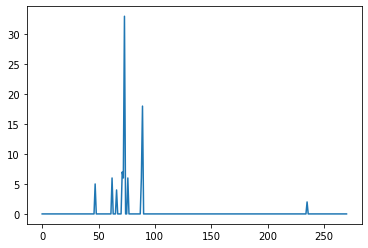

In [14]:
plt.plot(Trials[:,3])

In [15]:
CompCorron200Trials.shape

(10000, 89, 201)

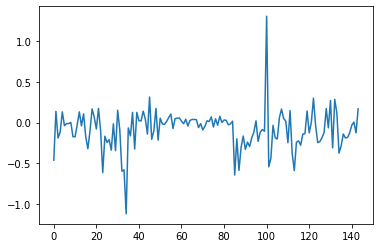

In [16]:
plt.plot(CompCorron200Trials[:,5,5])

In [17]:
CompCorron200[np.isnan(CompCorron200)]=0

In [18]:
CompCorron200Trialn=np.zeros((CompCorron200Trials.shape))

In [19]:
CompOrder[0][22]='CLint'

In [20]:
GAL4Trials.shape

(10000, 89)

# Plot summaries

# Extra code

## Anatomical regions 1

## Anatomical Regions

## Correlation regions PAN

## Correlation regions Cha

## Correlation binary components Forced

## Func Regions TH

## Func regions

0


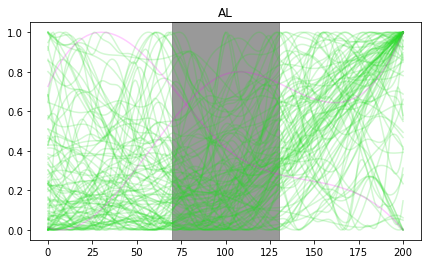

1


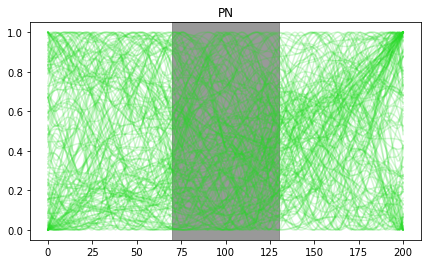

2


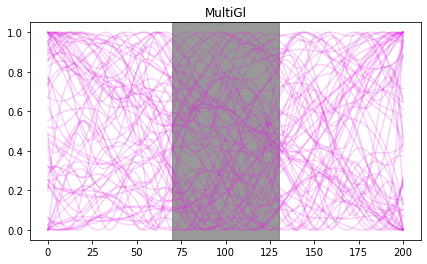

3


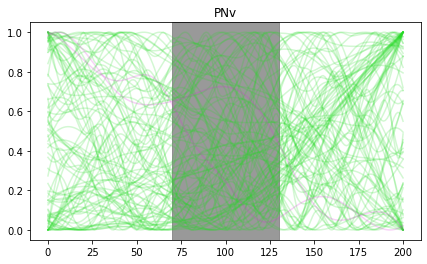

4


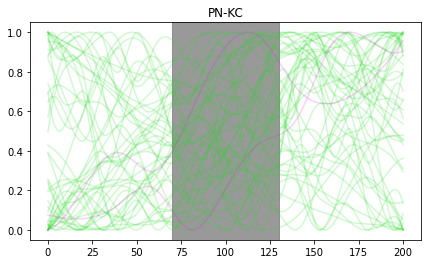

5


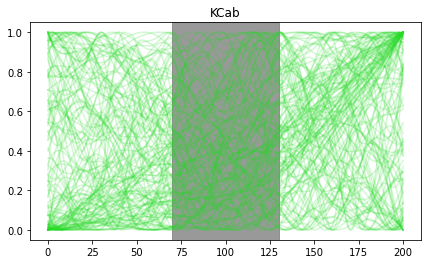

6


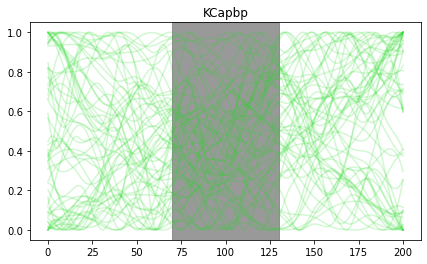

7


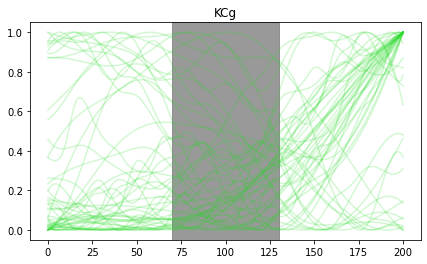

8


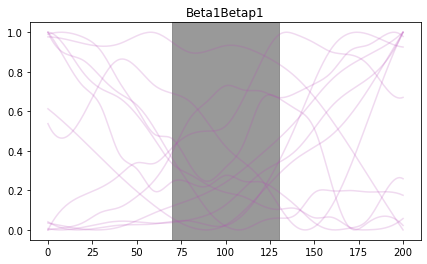

9


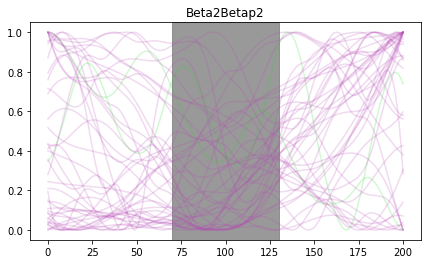

10


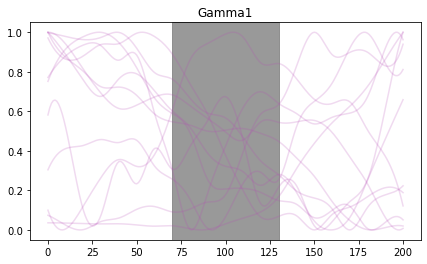

11


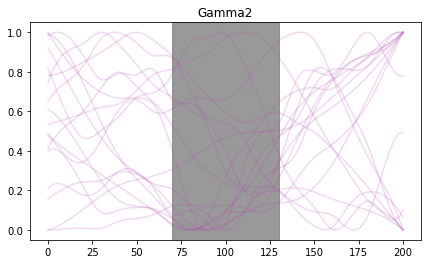

12


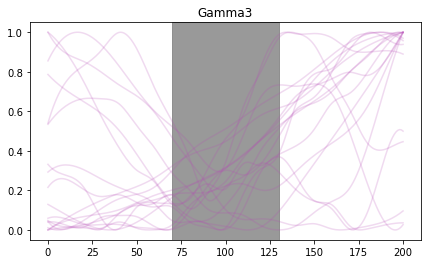

13


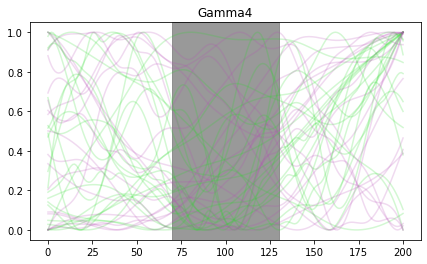

14


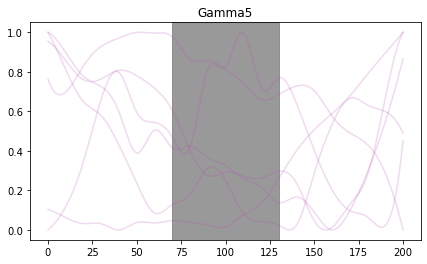

15


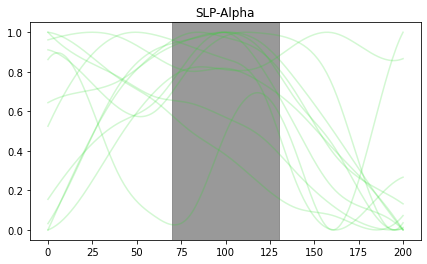

16


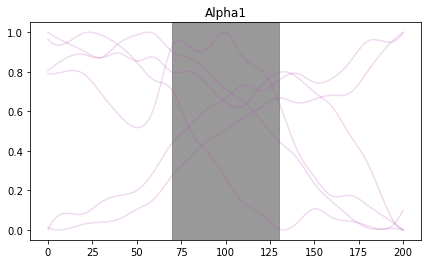

17


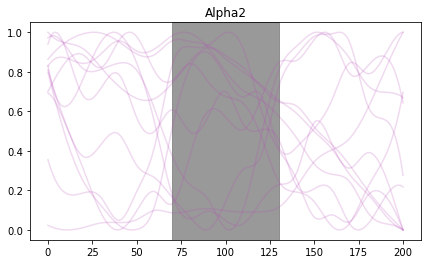

18


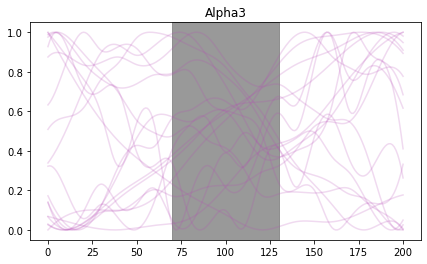

19


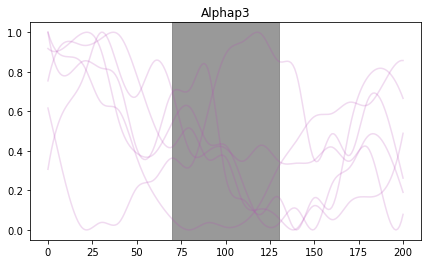

20
21


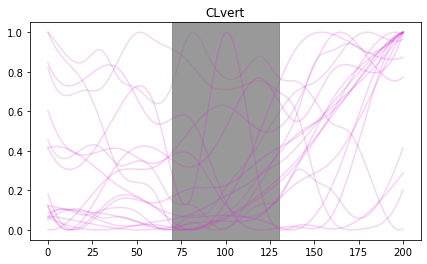

22
23


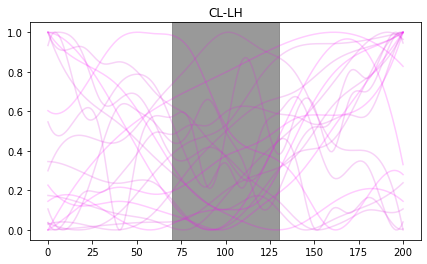

24


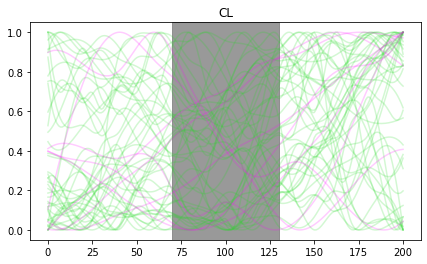

25


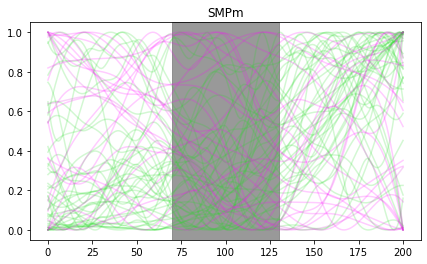

26
27


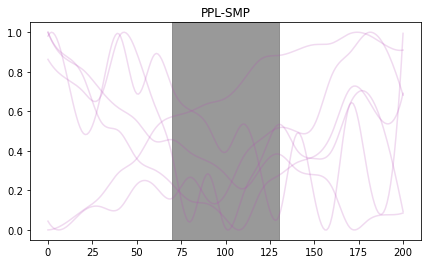

28


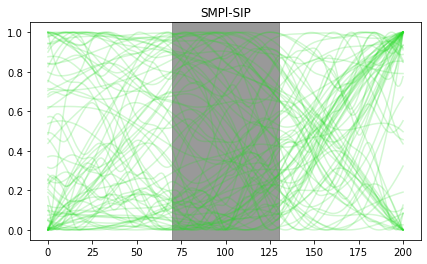

29


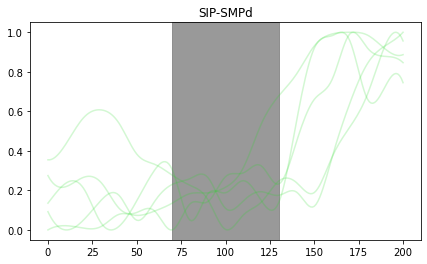

30


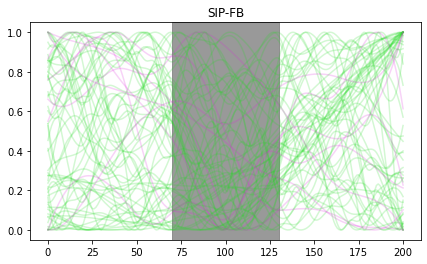

31


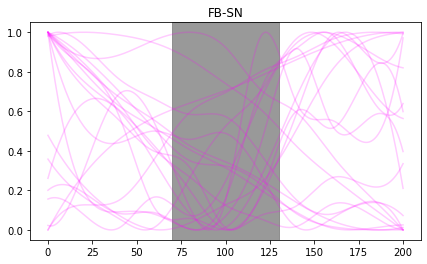

32


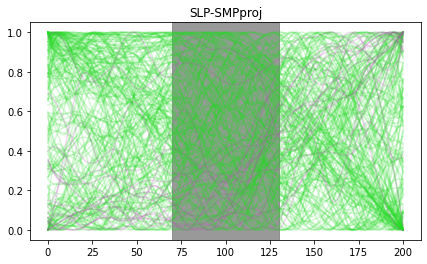

33


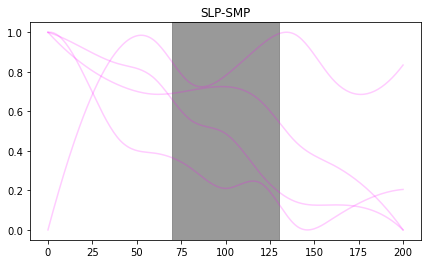

34


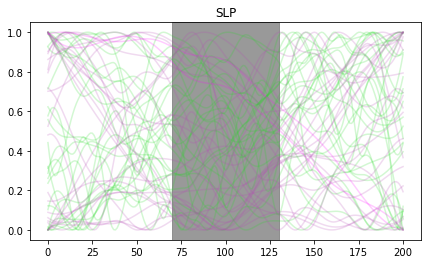

35


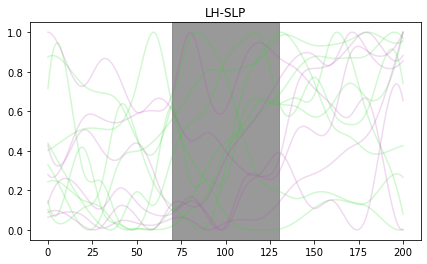

36


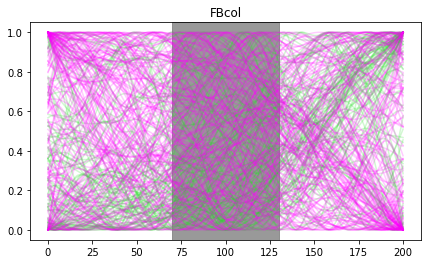

37


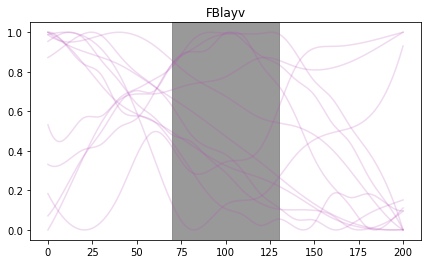

38


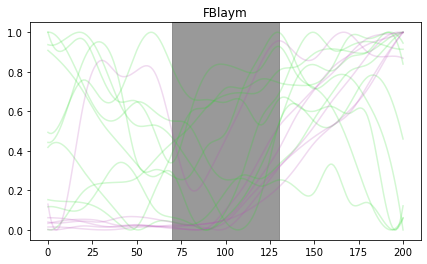

39


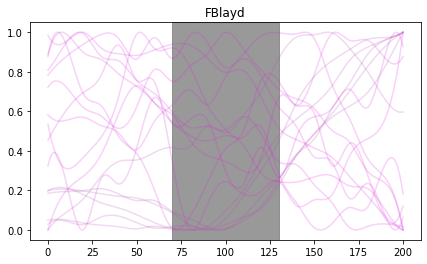

40
41


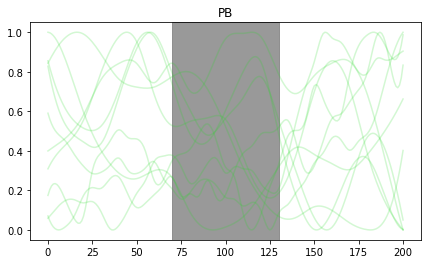

42


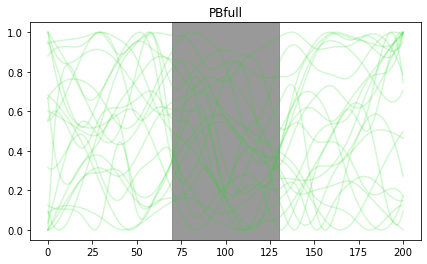

43


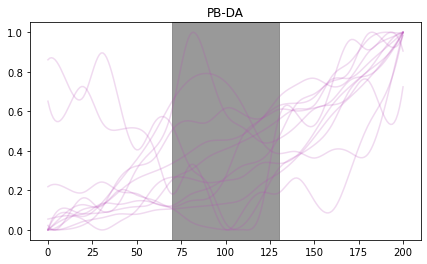

44


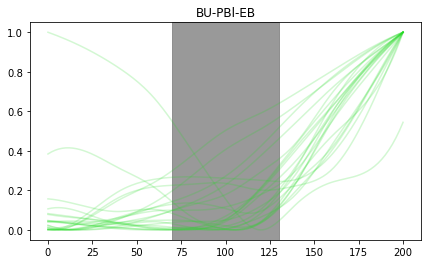

45


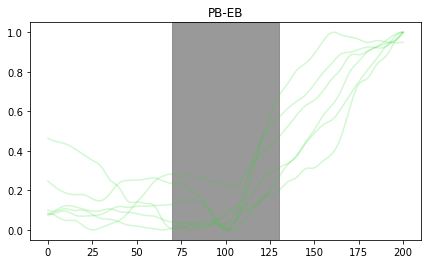

46


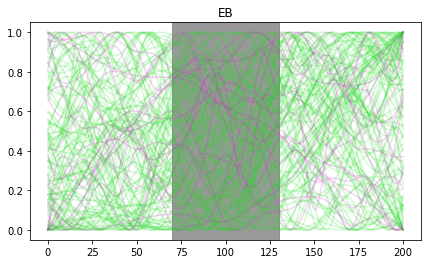

47


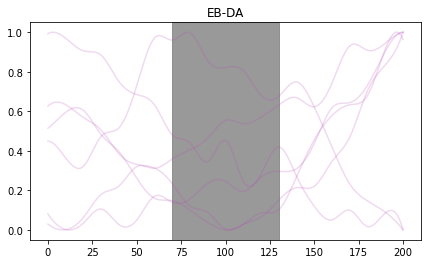

48


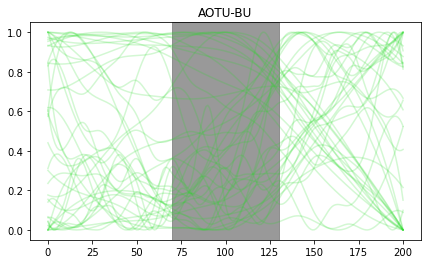

49


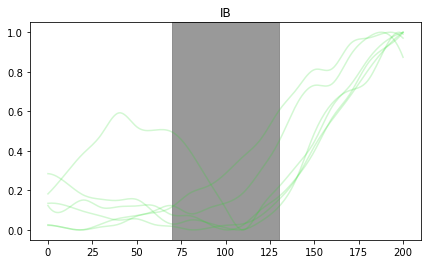

50


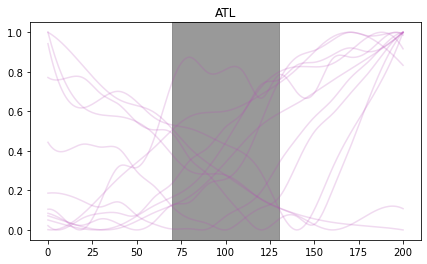

51


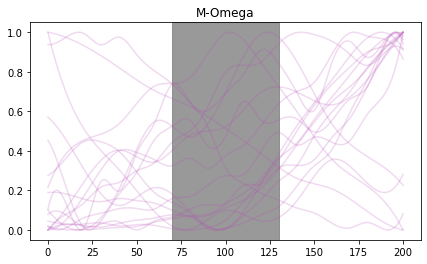

52


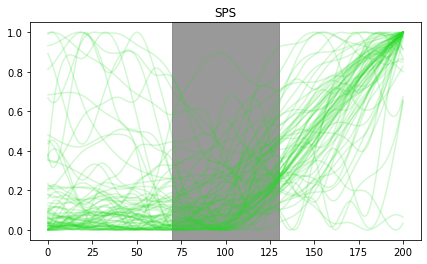

53


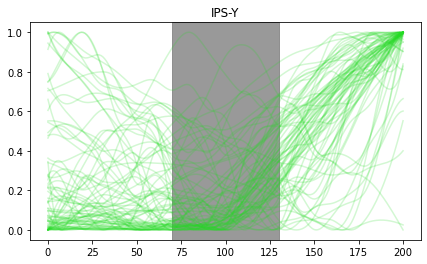

54


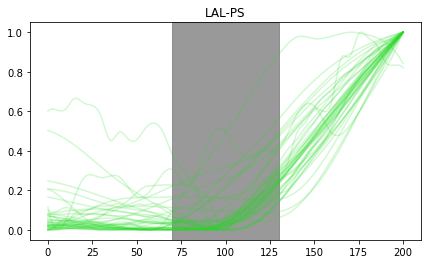

55


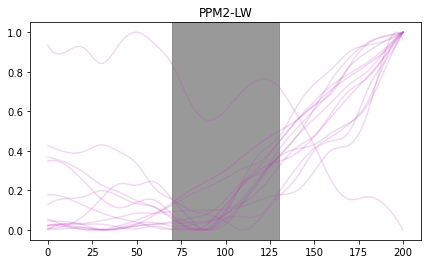

56


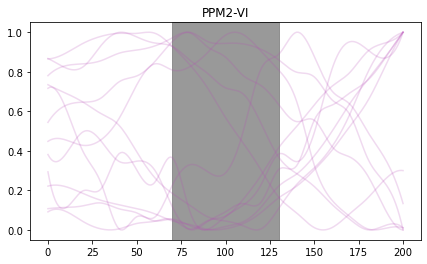

57
58


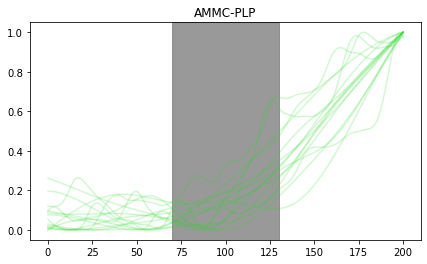

59


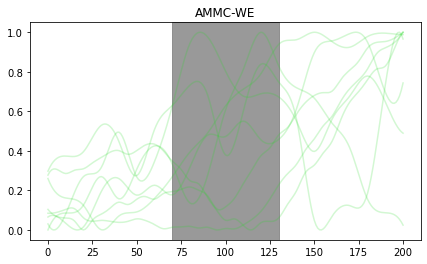

60
61


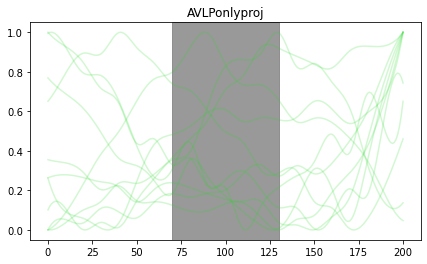

62


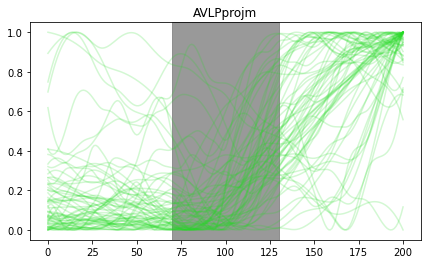

63


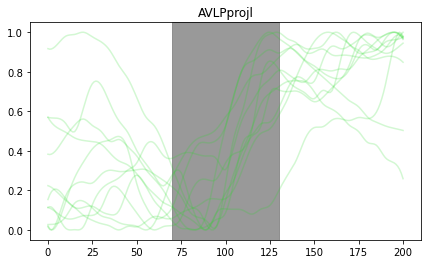

64


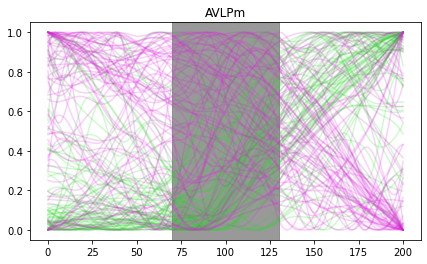

65


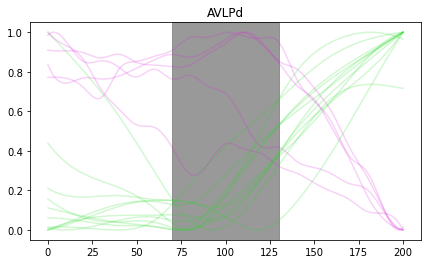

66


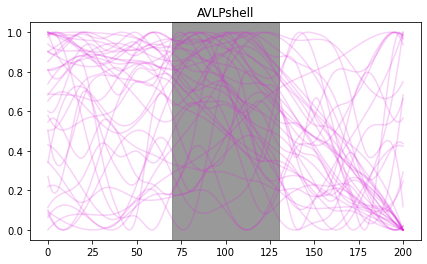

67
68


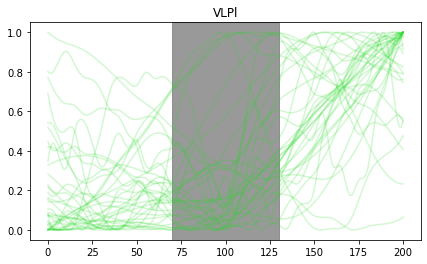

69
70


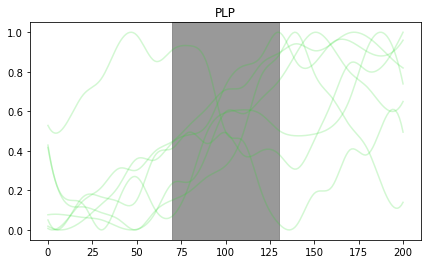

71


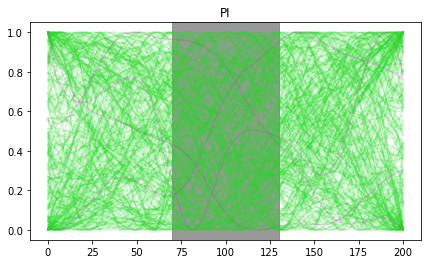

72


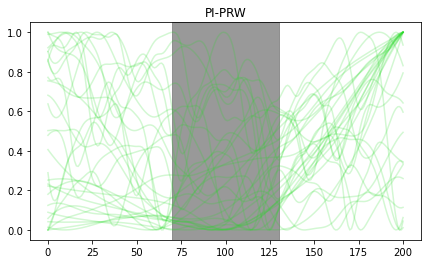

73


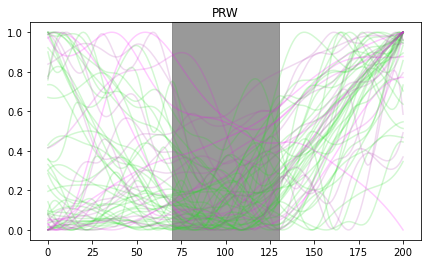

74


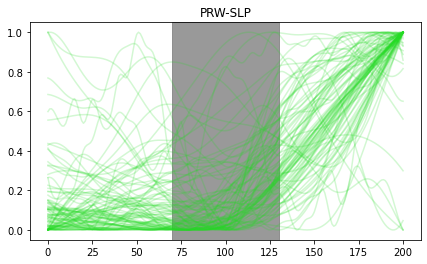

75


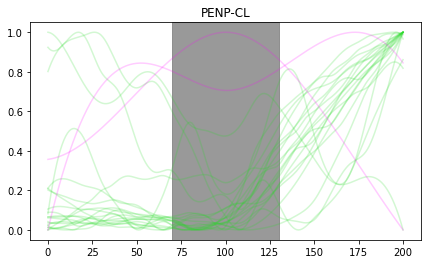

76
77


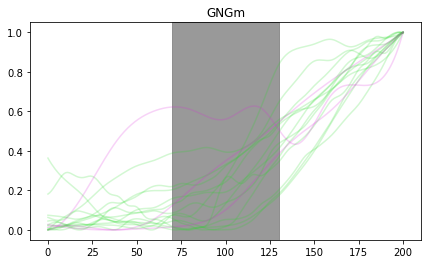

78


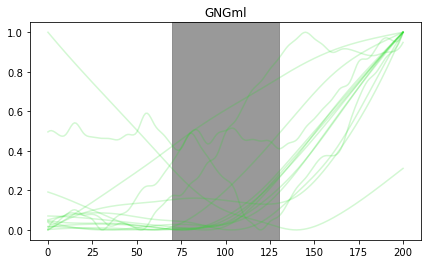

79


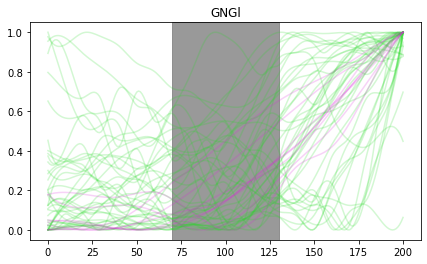

80
81


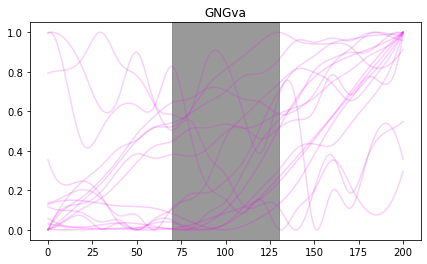

82


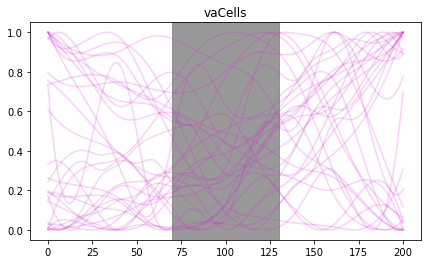

83


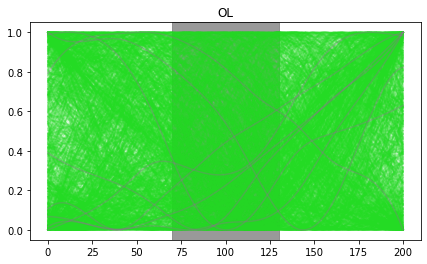

84
85


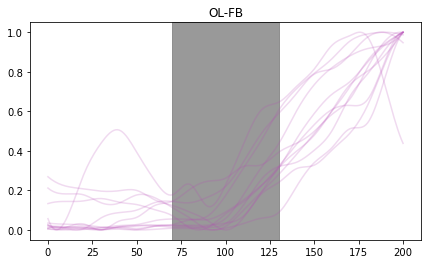

86


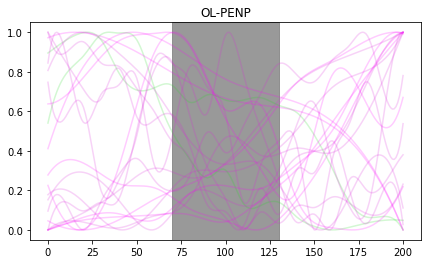

87
88


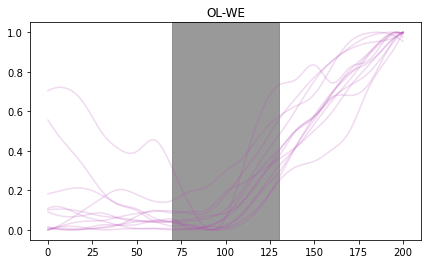

In [69]:
# Plot all trials
CompCorrOn=np.zeros((len(CompOrder),201))

j=0
#j=23
for l in range(len(CompOrder)):
#for l in range(26,30):
    print(l)
    if sum(Trials[:,l])>3:
        fig, axs = plt.subplots(1, 1,figsize=(7,4))
        for k in range(10000):
            C=CompCorron200Trials[k,l,:]
            if (np.nanmax(C)-np.nanmin(C))!=0 and FRTrials[k,l]<=20:
                CompCorron200Trialn[k,l,:]=(C-np.nanmin(C))/(np.nanmax(C)-np.nanmin(C))            
                plt.plot(CompCorron200Trialn[k,l,:],alpha=0.2,c=[GAL4Trials[k,l]/7,1-GAL4Trials[k,l]/7,GAL4Trials[k,l]/7])
        plt.title(CompOrder[0][l]) 
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].axvline(x=50)
        plt.axvspan(100-30, 100+30, alpha=0.8, color='grey')
        #plt.get_yaxis().set_visible(False)

        j=j+1
        
        plt.savefig('C:\\Users\\Soso\\Desktop\\Aimon2022\\ForcedAllTrials_20Hz_andless2sbefore_Comp'+CompOrder[0][l]+'.png')
        plt.show()
#    except:
  #       continue   

#plt.savefig('Z:\GrunwaldKadow_group\Sophie\ForcedWalkProject\Figures\Figure6\Fig6CorronComponentsAllTrials_AllFreq_1sbeforeOlfSS.svg')


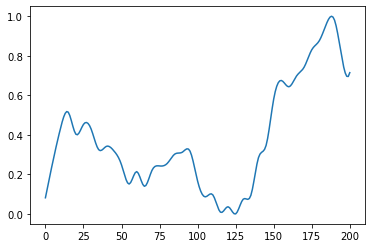

In [73]:
plt.plot(CompCorron200Trialn[5,1,:])

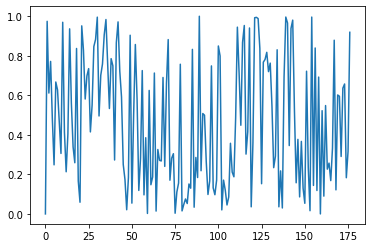

In [74]:
plt.plot(CompCorron200Trialn[:,1,50])

In [75]:
np.save('Forced200Trialn.npy',CompCorron200Trialn)

In [22]:
#CompOrder=pd.read_csv('Z:\GrunwaldKadow_group\Sophie\ForcedWalkProject\AllCompIDOrderedVF.txt',header=None)
ForcedCompCorron200Trialn=np.load('C:\\Users\Soso\Desktop\Aimon2022\Fig6Data\Forced200Trialn.npy')
hf = h5py.File('C:\\Users\Soso\Desktop\Aimon2022\Fig6Data\ForcedTrials2spre.h5', 'r')
ForcedCompCorron200=hf.get('CompCorron200')[:]
ForcedCompCorroff200=hf.get('CompCorroff200')[:]
ForcedCompCorronoff200=hf.get('CompCorronoff200')[:]
Forcedkall=hf.get('kall')[()]
ForcedTrials=hf.get('Trials')[:]
ForcedCompCorron200Trials=hf.get('CompCorron200Trials')[:]
ForcednFlies=hf.get('NComponents')[:]
ForcedFRTrials=hf.get('FRTrials')[:]
ForcedGAL4Trials=hf.get('GAL4Trials')[:]
ForcedUASTrials=hf.get('UASTrials')[:]
ForcedFlyIDTrials=hf.get('FlyIDTrials')[:]
hf.close()

In [23]:
Trials.shape

(271, 89)

In [27]:
GAL4num = {np.nan:0,'Nsyb':1, 'GMR57C10':1, 'Cha':2, 'Vglut':3, 'Gad':4, 'TH':5, 'Trh':6, 'TDC':7}  

In [28]:
CompCorron200Trialn.shape

(10000, 89, 201)

In [29]:
CompCorron200Trialn.shape

(10000, 89, 201)

In [30]:
FRTrials.shape

(10000, 89)

In [35]:
np.unique(FlyIDTrials[:,0])

array([  0.,  22.,  25.,  26.,  27.,  28.,  29.,  30.,  36., 126.])

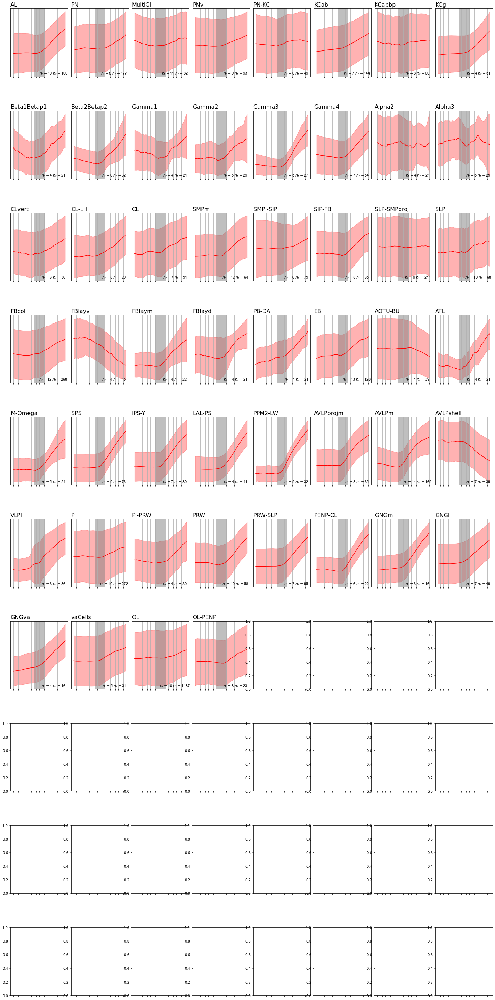

In [152]:
ForcedCompCorron200Trialn[np.mean(ForcedCompCorron200Trialn)==0,:,:]=np.nan
fig, axs = plt.subplots(10, 8,figsize=(20,40),sharex=True)
l=0
for j in range(len(CompOrder)):
    Condition1=(FRTrials[:,j]>=30)
    if sum(ForcedTrials[:,j])>3 and len(np.unique(ForcedFlyIDTrials[:,j]))>3:
        C=ForcedCompCorron200Trials[:,j,:]
        #err=np.nanstd(C,axis=0)/np.sqrt(sum(Trials[:,j])-1)
        #C0=CompCorron200Trialn[:,j,:]
        #C=C0[Condition1,:]
        err=np.abs(np.nanstd(C,axis=0)/np.sqrt(len(np.unique(ForcedFlyIDTrials[:,j]))-1))
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].plot(np.nanmean(C,axis=0),color='red')
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(err+np.nanmean(CompCorron200n[:,j,:],axis=0))
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CompCorron200n[:,j,:],axis=0)-err)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_title(CompOrder[0][j],fontsize=16,loc='left')    
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between((np.nanmean(CompCorron200n[:,j,:],axis=0)-err), (np.nanmean(CompCorron200n[i,j,:],axis=0)+err),color='grey',alpha=0.5)  
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].fill_between(range(201),np.nanmean(C,axis=0)-err,err+np.nanmean(C,axis=0),color='red',
                     alpha=0.3)  
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_xaxis().set_visible(False)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_yaxis().set_visible(False)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].text(0.75, 0.05, '$n_f=$'+str(len(np.unique(ForcedFlyIDTrials[:,j])))+' $n_t=$'+ str(10000-np.sum(np.isnan(ForcedCompCorron200Trials[:,j,100]))), fontsize=11,fontname="Arial",horizontalalignment='center', verticalalignment='center', transform=axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].transAxes)

        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].axvspan(100-20, 100+20, alpha=0.5, color='grey')
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xticks([0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190,200])
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xticklabels([])
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].xaxis.grid()
        for tic in axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].xaxis.get_major_ticks():
            tic.tick1On = tic.tick2On = False
        l=l+1

    #print(np.nanmax(CompCorrOnOff[j,:]))
plt.tight_layout()    
plt.subplots_adjust(wspace=0.06,hspace=0.5)
plt.savefig('C:\\Users\\Soso\\Desktop\\Aimon2022\\ForcedAllComponentsTrialsAv20Hz_and_less_2sbefore.svg')
plt.savefig('C:\\Users\\Soso\\Desktop\\Aimon2022\\ForcedAllComponentsTrialsAv20Hz_and_less_2sbefore.png')
plt.show() 


In [39]:
CompOrder=pd.read_csv('Z:\GrunwaldKadow_group\Sophie\WalkProject\AllCompIDOrderedVF.txt',header=None)
CompCorron200Trialn=np.load('C:\\Users\Soso\Desktop\Aimon2022\Fig6Data\CompCorron200Trialn20Hzlow.npy')
hf = h5py.File('C:\\Users\Soso\Desktop\Aimon2022\Fig6Data\Trials2spre.h5', 'r')
CompCorron200=hf.get('CompCorron200')[:]
CompCorroff200=hf.get('CompCorroff200')[:]
CompCorronoff200=hf.get('CompCorronoff200')[:]
kall=hf.get('kall')[()]
Trials=hf.get('Trials')[:]
CompCorron200Trials=hf.get('CompCorron200Trials')[:]
nFlies=hf.get('NComponents')[:]
FRTrials=hf.get('FRTrials')[:]
GAL4Trials=hf.get('GAL4Trials')[:]
UASTrials=hf.get('UASTrials')[:]
FlyIDTrials=hf.get('FlyIDTrials')[:]
hf.close()
CompCorron200Trialn[np.mean(CompCorron200Trialn)==0,:,:]=np.nan

In [46]:
GAL4Trials.shape

(10000, 89)

In [40]:
FRTrials.shape

(10000, 89)

In [41]:
np.sum((FRTrials[:,0]==0))

9316

In [42]:
np.sum((FRTrials[:,0]>=30))

243

In [43]:
np.sum((FRTrials[:,0]<30))

9757

In [44]:
CompCorron200Trials.shape

(10000, 89, 201)

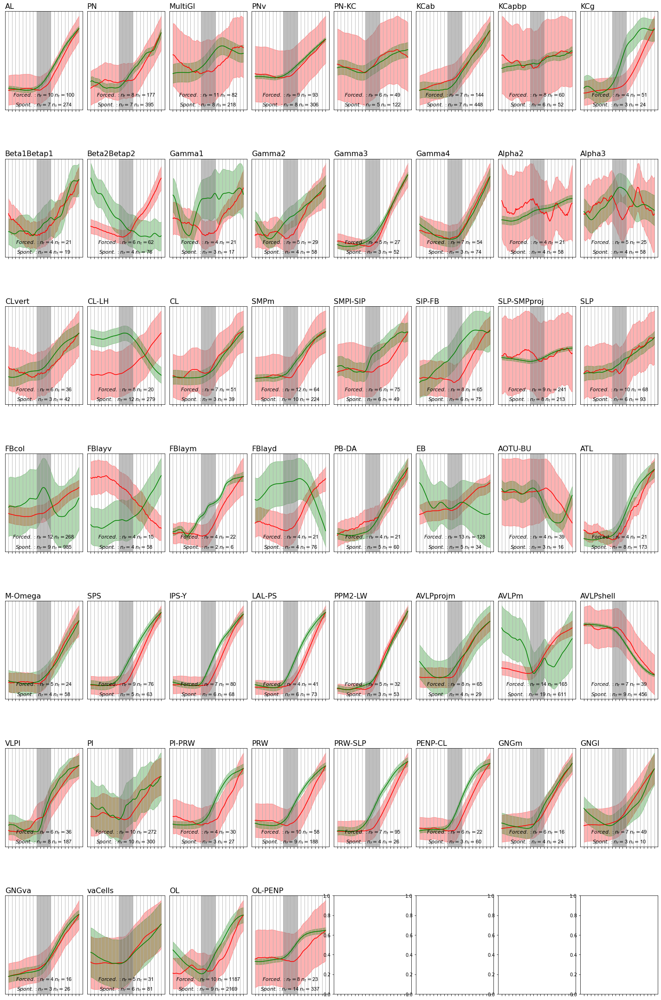

In [56]:
ForcedCompCorron200Trialn[np.mean(ForcedCompCorron200Trialn)==0,:,:]=np.nan
CompCorron200Trialn[np.mean(CompCorron200Trialn)==0,:,:]=np.nan
fig, axs = plt.subplots(7, 8,figsize=(20,30),sharex=True)
l=0
for j in range(len(CompOrder)):
    #Condition1=(FRTrials[:,j]>=30)
    if sum(ForcedTrials[:,j])>3 and len(np.unique(ForcedFlyIDTrials[:,j]))>3:
        C=ForcedCompCorron200Trials[:,j,:]
        #err=np.nanstd(C,axis=0)/np.sqrt(sum(Trials[:,j])-1)
        #C0=CompCorron200Trialn[:,j,:]
        #C=C0[Condition1,:]
        #err=np.abs(np.nanstd(C,axis=0)/np.sqrt(len(np.unique(ForcedFlyIDTrials[:,j]))-1))/(np.max(np.nanmean(C,axis=0))-np.min(np.nanmean(C,axis=0)))
        err=np.abs(np.nanstd(C,axis=0)/np.sqrt(10000-np.sum(np.isnan(ForcedCompCorron200Trials[:,j,100]))))/(np.max(np.nanmean(C,axis=0))-np.min(np.nanmean(C,axis=0)))
        Cmean=(np.nanmean(C,axis=0)-np.min(np.nanmean(C,axis=0)))/(np.max(np.nanmean(C,axis=0))-np.min(np.nanmean(C,axis=0)))
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].plot(Cmean,color='red')
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(err+np.nanmean(CompCorron200n[:,j,:],axis=0))
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CompCorron200n[:,j,:],axis=0)-err)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_title(CompOrder[0][j],fontsize=16,loc='left')    
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between((np.nanmean(CompCorron200n[:,j,:],axis=0)-err), (np.nanmean(CompCorron200n[i,j,:],axis=0)+err),color='grey',alpha=0.5)  
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].fill_between(range(201),Cmean-err,err+Cmean,color='red',
                     alpha=0.3)  
        
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].text(0.5, 0.15, '$Forced.: n_f=$'+str(len(np.unique(ForcedFlyIDTrials[:,j])))+' $n_t=$'+ str(10000-np.sum(np.isnan(ForcedCompCorron200Trials[:,j,100]))), fontsize=11,fontname="Arial",horizontalalignment='center', verticalalignment='center', transform=axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].transAxes)

        #Condition1=(FRTrials[:,j]<=20)
        
        C0=CompCorron200Trials[np.logical_and(GAL4Trials[:,j]!=2,GAL4Trials[:,j]!=3),j,:]
        FlyIDTrials0=FlyIDTrials[np.logical_and(GAL4Trials[:,j]!=2,GAL4Trials[:,j]!=3),j]
        GAL4Trials1=GAL4Trials[np.logical_and(GAL4Trials[:,j]!=2,GAL4Trials[:,j]!=3),j]
        FRTrials1=FRTrials[np.logical_and(GAL4Trials[:,j]!=2,GAL4Trials[:,j]!=3),j]
        
        
        C=C0[np.logical_and(GAL4Trials1!=4,FRTrials1<=20),:]
        FlyIDTrials1=FlyIDTrials0[np.logical_and(GAL4Trials1!=4,FRTrials1<=20)]
        
        #err=np.nanstd(C,axis=0)/np.sqrt(sum(Trials[:,j])-1)
        #C0=CompCorron200Trialn[:,j,:]
        #C=C0[Condition1,:]
        Cmean=(np.nanmean(C,axis=0)-np.min(np.nanmean(C,axis=0)))/(np.max(np.nanmean(C,axis=0))-np.min(np.nanmean(C,axis=0)))
        #err=np.abs(np.nanstd(C,axis=0)/np.sqrt(len(np.unique(FlyIDTrials[:,j]))-1))/(np.max(np.nanmean(C,axis=0))-np.min(np.nanmean(C,axis=0)))
        err=np.abs(np.nanstd(C,axis=0)/np.sqrt((10000-np.sum(np.isnan(CompCorron200Trials[:,j,100])))))/(np.max(np.nanmean(C,axis=0))-np.min(np.nanmean(C,axis=0)))
        
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].plot(Cmean,color='green')
        #axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(err+np.nanmean(CompCorron200n[:,j,:],axis=0))
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].plot(np.nanmean(CompCorron200n[:,j,:],axis=0)-err)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_title(CompOrder[0][j],fontsize=16,loc='left')    
       # axs[int(np.floor(j/8)),j-int(np.floor(j/8)*8)].fill_between((np.nanmean(CompCorron200n[:,j,:],axis=0)-err), (np.nanmean(CompCorron200n[i,j,:],axis=0)+err),color='grey',alpha=0.5)  
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].fill_between(range(201),Cmean-err,err+Cmean,color='green',
                     alpha=0.3)          
        
        
        
        #axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_xaxis().set_visible(False)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].get_yaxis().set_visible(False)
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].text(0.5, 0.05, '$Spont.: n_f=$'+str(len(np.unique(FlyIDTrials1)))+' $n_t=$'+ str(C.shape[0]-np.sum(np.isnan(C[:,100]))), fontsize=11,fontname="Arial",horizontalalignment='center', verticalalignment='center', transform=axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].transAxes)

        
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].axvspan(100-20, 100+20, alpha=0.5, color='grey')
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xticks([0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190,200])
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].set_xticklabels([])
        axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].xaxis.grid()
        for tic in axs[int(np.floor(l/8)),l-int(np.floor(l/8)*8)].xaxis.get_major_ticks():
            tic.tick1On = tic.tick2On = False
        l=l+1

    #print(np.nanmax(CompCorrOnOff[j,:]))
plt.tight_layout()    
plt.subplots_adjust(wspace=0.06,hspace=0.5)
plt.savefig('C:\\Users\\Soso\\Desktop\\Aimon2022\\ForcedandSpontAllComponentsTrialsAv20Hz_and_less_2sbefore.svg')
plt.savefig('C:\\Users\\Soso\\Desktop\\Aimon2022\\ForcedandSpontAllComponentsTrialsAv20Hz_and_less_2sbefore.png')
plt.show() 

